<a href="https://colab.research.google.com/github/vaikkunth/DPMechanisms/blob/master/infoGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Implementation of infoGANs
Reference: https://arxiv.org/pdf/1606.03657.pdf

In [ ]:
# Run the comment below only when using Google Colab 
!pip install torch torchvision

In [ ]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms
from torchvision.utils import save_image

In [ ]:
import numpy as np
import datetime
import os, sys

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow, imsave
%matplotlib inline

In [ ]:
MODEL_NAME = 'infoGAN'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')
# !cd /content/drive/My\ Drive/GAN_Prune

In [ ]:
def to_onehot(x, num_classes=10):
    assert isinstance(x, int) or isinstance(x, (torch.LongTensor, torch.cuda.LongTensor))
    if isinstance(x, int):
        c = torch.zeros(1, num_classes).long()
        c[0][x] = 1
    else:
        x = x.cpu()
        c = torch.LongTensor(x.size(0), num_classes)
        c.zero_()
        c.scatter_(1, x, 1) # dim, index, src value
    return c

In [ ]:
def sample_noise(batch_size, n_noise, n_c_discrete, n_c_continuous, label=None, supervised=False):
    z = torch.randn(batch_size, n_noise).to(DEVICE)
    if supervised:
        c_discrete = to_onehot(label).to(DEVICE) # (B,10)
    else:
        c_discrete = to_onehot(torch.LongTensor(batch_size, 1).random_(0, n_c_discrete)).to(DEVICE) # (B,10)
    c_continuous = torch.zeros(batch_size, n_c_continuous).uniform_(-1, 1).to(DEVICE) # (B,2)
    c = torch.cat((c_discrete.float(), c_continuous), 1)
    return z, c

In [ ]:
def get_sample_image():
    """
        save sample 100 images
    """
    images = []
    # continuous code
    for cc_type in range(2):
        for num in range(10):
            fix_z = torch.randn(1, n_noise)
            z = fix_z.to(DEVICE)
            cc = -1
            for i in range(10):
                cc += 0.2
                c_discrete = to_onehot(num).to(DEVICE) # (B,10)
                c_continuous = torch.zeros(1, n_c_continuous).to(DEVICE)
                c_continuous.data[:,cc_type].add_(cc)
                c = torch.cat((c_discrete.float(), c_continuous), 1)
                y_hat = G(z, c)
                line_img = torch.cat((line_img, y_hat.view(28, 28)), dim=1) if i > 0 else y_hat.view(28, 28)
            all_img = torch.cat((all_img, line_img), dim=0) if num > 0 else line_img
        img = all_img.cpu().data.numpy()
        images.append(img)
    # discrete code
    for num in range(10):
        c_discrete = to_onehot(num).to(DEVICE) # (B,10)
        for i in range(10):
            z = torch.randn(1, n_noise).to(DEVICE)
            c_continuous = torch.zeros(1, n_c_continuous).to(DEVICE)
            c = torch.cat((c_discrete.float(), c_continuous), 1)
            y_hat = G(z, c)
            line_img = torch.cat((line_img, y_hat.view(28, 28)), dim=1) if i > 0 else y_hat.view(28, 28)
        all_img = torch.cat((all_img, line_img), dim=0) if num > 0 else line_img
    img = all_img.cpu().data.numpy()
    images.append(img)
    return images[0], images[1], images[2]

In [ ]:
def log_gaussian(c, mu, var):
    """
        criterion for Q(condition classifier)
    """
    return -((c - mu)**2)/(2*var+1e-8) - 0.5*torch.log(2*np.pi*var+1e-8)

In [ ]:
class Discriminator(nn.Module):
    """
        Convolutional Discriminator for MNIST
    """
    def __init__(self, in_channel=1):
        super(Discriminator, self).__init__()
        self.layer1 = nn.Sequential(# 28 -> 14
            nn.Conv2d(in_channel, 64, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.1),
        )
        self.layer2 = nn.Sequential(# 14 -> 7
            nn.Conv2d(64, 128, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.1),
        )
        self.layer3 = nn.Sequential(#
            nn.Linear(128*7*7, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.1),
        )
        self.fc = nn.Sequential(
            nn.Linear(1024, 1),
            nn.Sigmoid(),
        )
    
    def forward(self, x):
        y_ = self.layer1(x)
        y_ = self.layer2(y_)
        y_ = y_.view(y_.size(0), -1)
        y_ = self.layer3(y_)
        d = self.fc(y_) # Real / Fake        
        return d, y_ # return with top layer features for Q

In [ ]:
class Qrator(nn.Module):
    """
        Regularization Network for increasing Mutual Information
    """
    def __init__(self):
        super(Qrator, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(1024, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.1),
            nn.Linear(128, 14),
        )
        
    def forward(self, x):
        # Seperate code
        c = self.fc(x)
        c_discrete = torch.softmax(c[:, :10], dim=-1) # Digit Label {0~9}
        c_mu = c[:, 10:12] # mu & var of Rotation & Thickness
        c_var = c[:, 12:14].exp() # mu & var of Rotation & Thickness
        return c_discrete, c_mu, c_var

In [ ]:
class Generator(nn.Module):
    """
        Convolutional Generator for MNIST
    """
    def __init__(self, input_size=62, code_size=12, num_classes=784):
        super(Generator, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Linear(input_size+code_size, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
        )
        self.layer2 = nn.Sequential(
            nn.Linear(1024, 7*7*128),
            nn.BatchNorm1d(7*7*128),
            nn.ReLU(),
        )
        self.layer3 = nn.Sequential(# input: 7 by 7, output: 14 by 14
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(),
        )
        self.layer4 = nn.Sequential(# input: 14 by 14, output: 28 by 28
            nn.ConvTranspose2d(64, 1, 4, stride=2, padding=1, bias=False),
            nn.Tanh(),
        )
        
    def forward(self, z, c):
        z = z.view(z.size(0), -1)
        c = c.view(c.size(0), -1)
        noise = torch.cat((z, c), 1)
#         print(noise.size())
        x_ = self.layer1(noise)
        x_ = self.layer2(x_)
        x_ = x_.view(x_.size(0), 128, 7, 7)
        x_ = self.layer3(x_)
        x_ = self.layer4(x_)
        return x_

In [ ]:
D = Discriminator().to(DEVICE)
G = Generator().to(DEVICE)
Q = Qrator().to(DEVICE)
# D.load_state_dict('D_dc.pkl')
# G.load_state_dict('G_dc.pkl')

In [ ]:
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize(mean=[0.5],
                                std=[0.5])]
)

In [ ]:
mnist = datasets.MNIST(root='../data/', train=True, transform=transform, download=True)

In [ ]:
batch_size = 128

In [ ]:
data_loader = DataLoader(dataset=mnist, batch_size=batch_size, shuffle=True, drop_last=True, pin_memory=True)

In [ ]:
bce_loss = nn.BCELoss()
ce_loss = nn.CrossEntropyLoss()

D_opt = torch.optim.Adam(D.parameters(), lr=2e-4, betas=(0.5, 0.99))
G_opt = torch.optim.Adam([{'params':G.parameters()}, {'params':Q.parameters()}], lr=1e-3, betas=(0.5, 0.99))

In [ ]:
max_epoch = 50 # need more than 200 epochs for training generator
step = 0
n_critic = 1 # for training more k steps about Discriminator
n_noise = 62
n_c_discrete, n_c_continuous = 10, 2

D_labels = torch.ones([batch_size, 1]).to(DEVICE) # Discriminator Label to real
D_fakes = torch.zeros([batch_size, 1]).to(DEVICE) # Discriminator Label to fake

In [ ]:
from functools import partial
import math
def compute_sigma(epsilon, delta, mM):
  sigma = (2*(mM)*math.sqrt(math.log(1/delta)))/epsilon
  return sigma
epsilon = 1e-3
delta = 1e-5
C = 0.01
mM = 1/len(data_loader)
sigma = compute_sigma(epsilon, delta, mM)
def process_grad(grad, sigma, C):
  grad = torch.clamp(grad, -C, C)
  #grad = grad + (1/batch_size) * sigma * sigma * C * C * torch.randn(parameter.shape).to(DEVICE) 
  grad = grad + (1/batch_size) * torch.normal(mean = 0.0, std = (sigma**2)*(C**2), size = grad.shape).to(DEVICE)

if sigma !=0:
  for parameter in D.parameters():
    parameter.register_hook(partial(process_grad, sigma = sigma , C = C)
        )
  for parameter in Q.parameters():
    parameter.register_hook(partial(process_grad, sigma = sigma, C = C))

In [ ]:
print(sigma)

14.500300052169043


Epoch: 0/50, Step: 0, D Loss: 1.4236111640930176, G Loss: 0.7479931116104126, GnQ Loss: 3.2830848693847656, Time: 2020-09-24 22:05:34


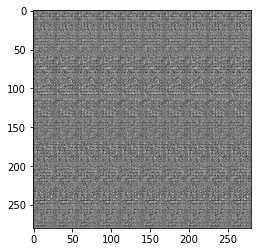

Epoch: 0/50, Step: 100, D Loss: 0.8529960513114929, G Loss: 1.2186063528060913, GnQ Loss: 2.8162412643432617, Time: 2020-09-24 22:05:55


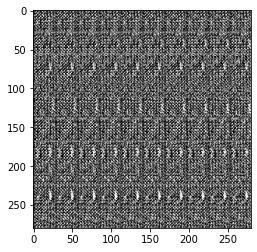

Epoch: 0/50, Step: 200, D Loss: 0.9059284925460815, G Loss: 1.1753629446029663, GnQ Loss: 2.660430908203125, Time: 2020-09-24 22:06:16


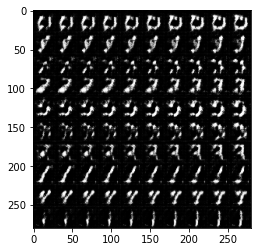

Epoch: 0/50, Step: 300, D Loss: 1.0533696413040161, G Loss: 1.0496635437011719, GnQ Loss: 2.5280513763427734, Time: 2020-09-24 22:06:36


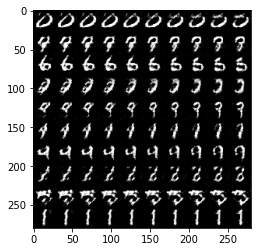

Epoch: 0/50, Step: 400, D Loss: 1.0871005058288574, G Loss: 1.0256140232086182, GnQ Loss: 2.5050716400146484, Time: 2020-09-24 22:06:57


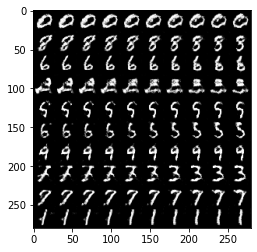

Epoch: 1/50, Step: 500, D Loss: 1.094853162765503, G Loss: 0.9299862384796143, GnQ Loss: 2.396106243133545, Time: 2020-09-24 22:07:18


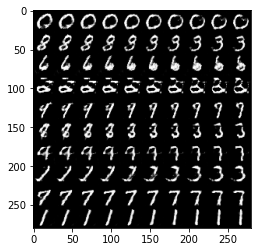

Epoch: 1/50, Step: 600, D Loss: 1.1622401475906372, G Loss: 1.0182684659957886, GnQ Loss: 2.4413838386535645, Time: 2020-09-24 22:07:38


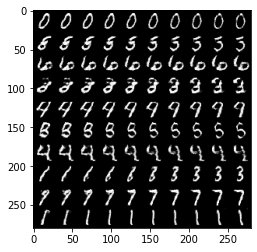

Epoch: 1/50, Step: 700, D Loss: 1.1170040369033813, G Loss: 0.9513779282569885, GnQ Loss: 2.4035258293151855, Time: 2020-09-24 22:07:59


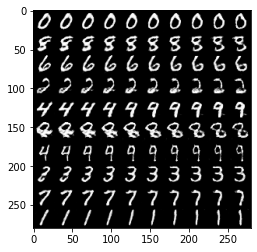

Epoch: 1/50, Step: 800, D Loss: 1.2149932384490967, G Loss: 0.950498104095459, GnQ Loss: 2.3755111694335938, Time: 2020-09-24 22:08:20


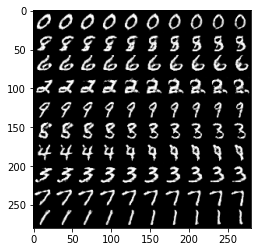

Epoch: 1/50, Step: 900, D Loss: 1.1999233961105347, G Loss: 0.9424317479133606, GnQ Loss: 2.3624870777130127, Time: 2020-09-24 22:08:41


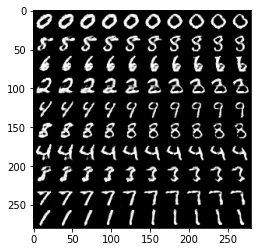

Epoch: 2/50, Step: 1000, D Loss: 1.158251166343689, G Loss: 0.9263118505477905, GnQ Loss: 2.334455728530884, Time: 2020-09-24 22:09:02


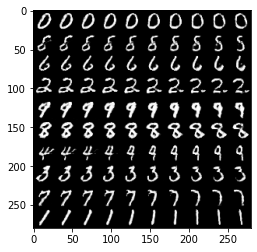

Epoch: 2/50, Step: 1100, D Loss: 1.1217033863067627, G Loss: 0.9648241400718689, GnQ Loss: 2.357086420059204, Time: 2020-09-24 22:09:23


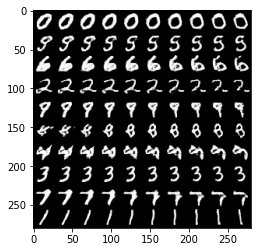

Epoch: 2/50, Step: 1200, D Loss: 1.1286790370941162, G Loss: 0.9466971158981323, GnQ Loss: 2.3432440757751465, Time: 2020-09-24 22:09:44


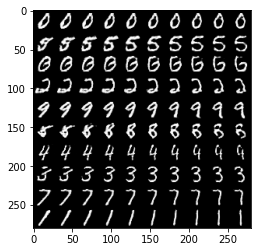

Epoch: 2/50, Step: 1300, D Loss: 1.1940354108810425, G Loss: 1.005136251449585, GnQ Loss: 2.4183433055877686, Time: 2020-09-24 22:10:05


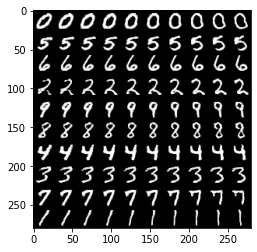

Epoch: 2/50, Step: 1400, D Loss: 1.2087833881378174, G Loss: 0.9425895810127258, GnQ Loss: 2.3387181758880615, Time: 2020-09-24 22:10:26


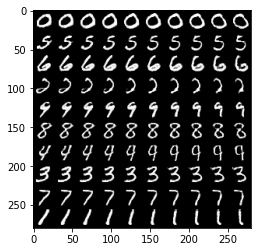

Epoch: 3/50, Step: 1500, D Loss: 1.1974444389343262, G Loss: 0.9509450197219849, GnQ Loss: 2.377793312072754, Time: 2020-09-24 22:10:47


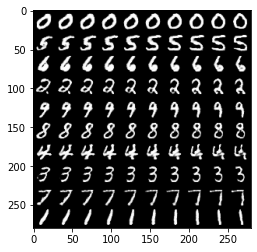

Epoch: 3/50, Step: 1600, D Loss: 1.135816216468811, G Loss: 1.040514588356018, GnQ Loss: 2.4370880126953125, Time: 2020-09-24 22:11:08


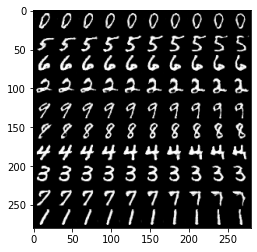

Epoch: 3/50, Step: 1700, D Loss: 1.0691804885864258, G Loss: 1.0169658660888672, GnQ Loss: 2.3738386631011963, Time: 2020-09-24 22:11:29


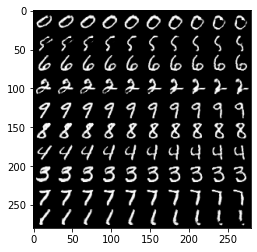

Epoch: 3/50, Step: 1800, D Loss: 1.1519418954849243, G Loss: 0.9474486112594604, GnQ Loss: 2.313126564025879, Time: 2020-09-24 22:11:51


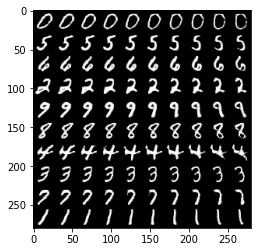

Epoch: 4/50, Step: 1900, D Loss: 1.0385510921478271, G Loss: 1.0072695016860962, GnQ Loss: 2.3665661811828613, Time: 2020-09-24 22:12:12


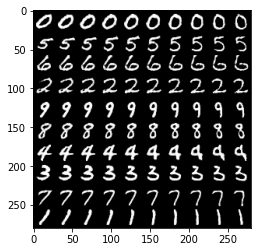

Epoch: 4/50, Step: 2000, D Loss: 1.056237816810608, G Loss: 1.0643385648727417, GnQ Loss: 2.4231984615325928, Time: 2020-09-24 22:12:34


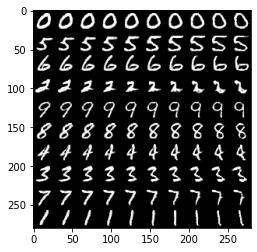

Epoch: 4/50, Step: 2100, D Loss: 1.1696341037750244, G Loss: 0.9398360848426819, GnQ Loss: 2.2983615398406982, Time: 2020-09-24 22:12:56


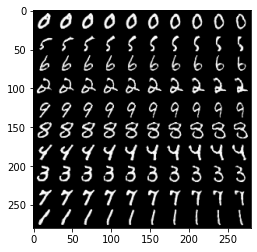

Epoch: 4/50, Step: 2200, D Loss: 1.161438226699829, G Loss: 0.9395536184310913, GnQ Loss: 2.2959680557250977, Time: 2020-09-24 22:13:17


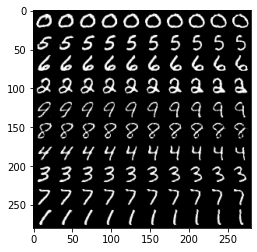

Epoch: 4/50, Step: 2300, D Loss: 1.0923738479614258, G Loss: 0.9874072074890137, GnQ Loss: 2.36067533493042, Time: 2020-09-24 22:13:39


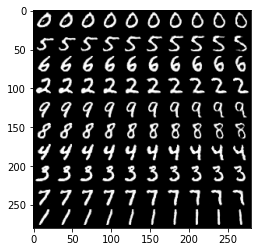

Epoch: 5/50, Step: 2400, D Loss: 1.1500988006591797, G Loss: 1.090463399887085, GnQ Loss: 2.456799268722534, Time: 2020-09-24 22:14:00


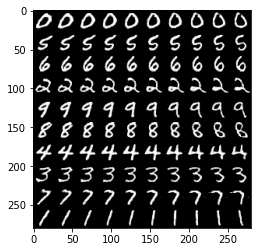

Epoch: 5/50, Step: 2500, D Loss: 1.1211073398590088, G Loss: 1.0650296211242676, GnQ Loss: 2.396890163421631, Time: 2020-09-24 22:14:21


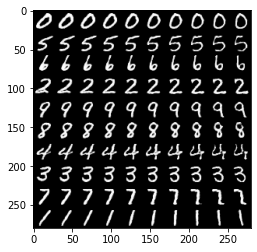

Epoch: 5/50, Step: 2600, D Loss: 1.037276029586792, G Loss: 1.0056378841400146, GnQ Loss: 2.412883758544922, Time: 2020-09-24 22:14:43


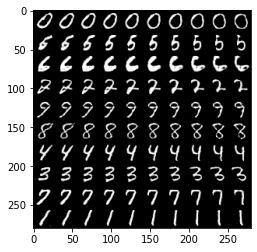

Epoch: 5/50, Step: 2700, D Loss: 0.9970041513442993, G Loss: 1.2200603485107422, GnQ Loss: 2.588270664215088, Time: 2020-09-24 22:15:04


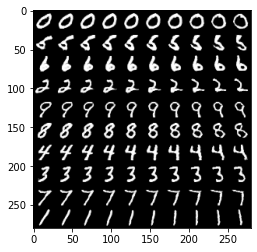

Epoch: 5/50, Step: 2800, D Loss: 1.0834424495697021, G Loss: 1.1583309173583984, GnQ Loss: 2.5028815269470215, Time: 2020-09-24 22:15:26


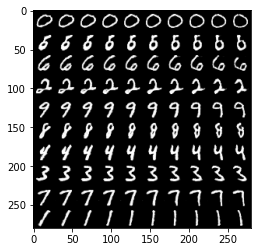

Epoch: 6/50, Step: 2900, D Loss: 0.9949294924736023, G Loss: 1.255277156829834, GnQ Loss: 2.608576774597168, Time: 2020-09-24 22:15:47


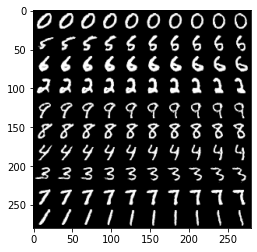

Epoch: 6/50, Step: 3000, D Loss: 1.1182461977005005, G Loss: 0.9837028384208679, GnQ Loss: 2.338299512863159, Time: 2020-09-24 22:16:09


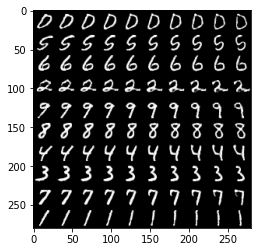

Epoch: 6/50, Step: 3100, D Loss: 1.0152394771575928, G Loss: 1.1658393144607544, GnQ Loss: 2.5047192573547363, Time: 2020-09-24 22:16:30


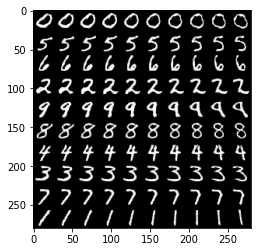

Epoch: 6/50, Step: 3200, D Loss: 1.0515174865722656, G Loss: 1.1649237871170044, GnQ Loss: 2.5268735885620117, Time: 2020-09-24 22:16:52


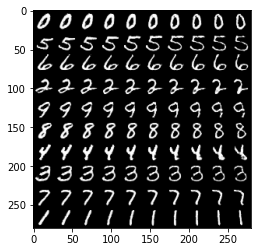

Epoch: 7/50, Step: 3300, D Loss: 1.0242624282836914, G Loss: 1.3042320013046265, GnQ Loss: 2.6532301902770996, Time: 2020-09-24 22:17:13


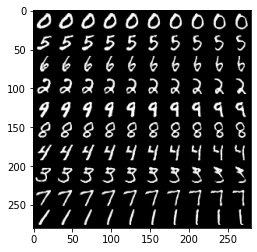

Epoch: 7/50, Step: 3400, D Loss: 1.0067682266235352, G Loss: 1.1431500911712646, GnQ Loss: 2.5246918201446533, Time: 2020-09-24 22:17:34


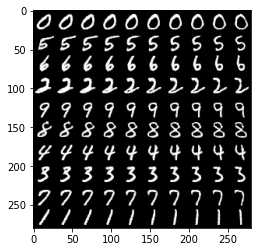

Epoch: 7/50, Step: 3500, D Loss: 1.0270297527313232, G Loss: 0.9590243101119995, GnQ Loss: 2.3136396408081055, Time: 2020-09-24 22:17:55


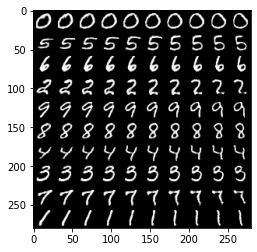

Epoch: 7/50, Step: 3600, D Loss: 0.9298896789550781, G Loss: 1.3013460636138916, GnQ Loss: 2.6564910411834717, Time: 2020-09-24 22:18:16


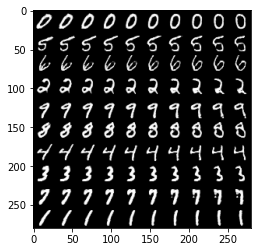

Epoch: 7/50, Step: 3700, D Loss: 1.0761759281158447, G Loss: 1.2745716571807861, GnQ Loss: 2.6265528202056885, Time: 2020-09-24 22:18:36


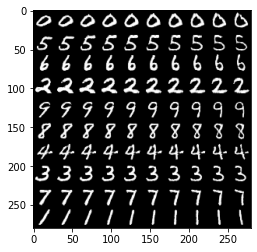

Epoch: 8/50, Step: 3800, D Loss: 0.9211255311965942, G Loss: 1.0758297443389893, GnQ Loss: 2.447396755218506, Time: 2020-09-24 22:18:57


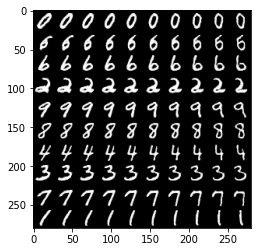

Epoch: 8/50, Step: 3900, D Loss: 0.9611505270004272, G Loss: 1.3046411275863647, GnQ Loss: 2.6684813499450684, Time: 2020-09-24 22:19:19


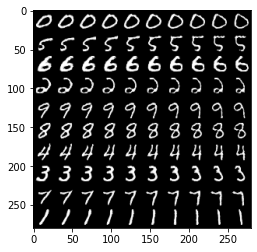

Epoch: 8/50, Step: 4000, D Loss: 0.9712113738059998, G Loss: 1.3563100099563599, GnQ Loss: 2.711967945098877, Time: 2020-09-24 22:19:40


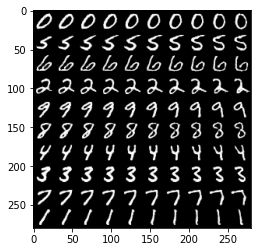

Epoch: 8/50, Step: 4100, D Loss: 0.985332727432251, G Loss: 1.4626281261444092, GnQ Loss: 2.855151414871216, Time: 2020-09-24 22:20:01


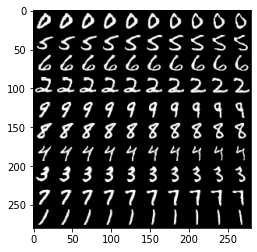

Epoch: 8/50, Step: 4200, D Loss: 1.0616521835327148, G Loss: 1.163424015045166, GnQ Loss: 2.526958465576172, Time: 2020-09-24 22:20:22


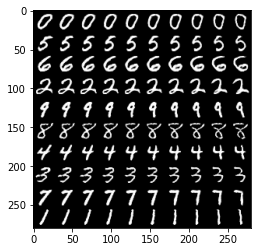

Epoch: 9/50, Step: 4300, D Loss: 0.9362808465957642, G Loss: 1.4339656829833984, GnQ Loss: 2.780284881591797, Time: 2020-09-24 22:20:43


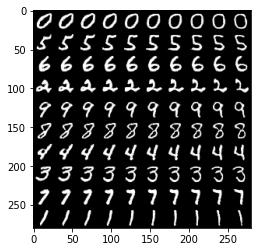

Epoch: 9/50, Step: 4400, D Loss: 0.9702506065368652, G Loss: 1.5889990329742432, GnQ Loss: 2.927309036254883, Time: 2020-09-24 22:21:04


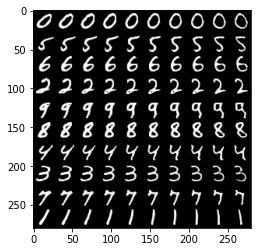

Epoch: 9/50, Step: 4500, D Loss: 0.8900569677352905, G Loss: 1.124863862991333, GnQ Loss: 2.492154598236084, Time: 2020-09-24 22:21:24


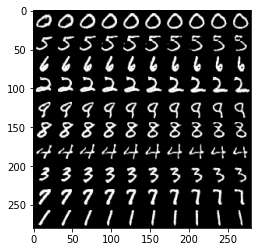

Epoch: 9/50, Step: 4600, D Loss: 0.8813726902008057, G Loss: 1.2360506057739258, GnQ Loss: 2.597966194152832, Time: 2020-09-24 22:21:45


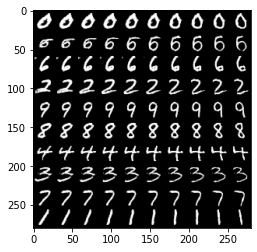

Epoch: 10/50, Step: 4700, D Loss: 0.8076021671295166, G Loss: 1.48014497756958, GnQ Loss: 2.828616142272949, Time: 2020-09-24 22:22:06


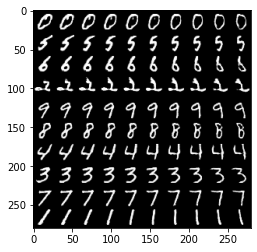

Epoch: 10/50, Step: 4800, D Loss: 0.8585834503173828, G Loss: 1.7590758800506592, GnQ Loss: 3.1096441745758057, Time: 2020-09-24 22:22:27


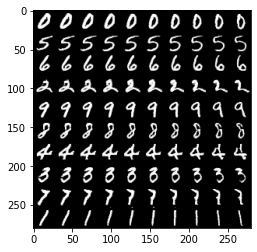

Epoch: 10/50, Step: 4900, D Loss: 0.8531437516212463, G Loss: 1.587674856185913, GnQ Loss: 2.932140827178955, Time: 2020-09-24 22:22:48


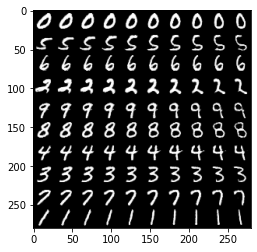

Epoch: 10/50, Step: 5000, D Loss: 0.7911602258682251, G Loss: 1.5372673273086548, GnQ Loss: 2.9077415466308594, Time: 2020-09-24 22:23:09


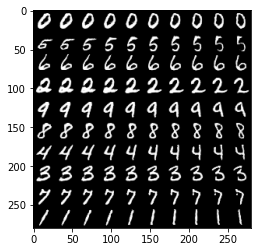

Epoch: 10/50, Step: 5100, D Loss: 0.8957772254943848, G Loss: 1.402066946029663, GnQ Loss: 2.764617443084717, Time: 2020-09-24 22:23:30


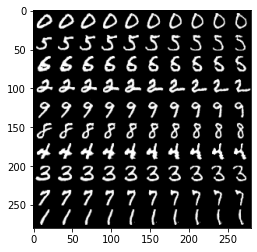

Epoch: 11/50, Step: 5200, D Loss: 0.8549480438232422, G Loss: 1.204906702041626, GnQ Loss: 2.5416183471679688, Time: 2020-09-24 22:23:51


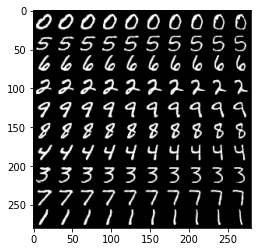

Epoch: 11/50, Step: 5300, D Loss: 0.8953854441642761, G Loss: 1.4422810077667236, GnQ Loss: 2.8173422813415527, Time: 2020-09-24 22:24:11


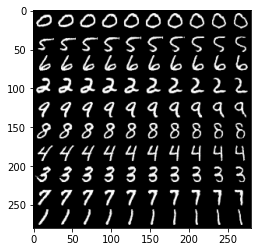

Epoch: 11/50, Step: 5400, D Loss: 0.7870839834213257, G Loss: 1.365224838256836, GnQ Loss: 2.735447645187378, Time: 2020-09-24 22:24:32


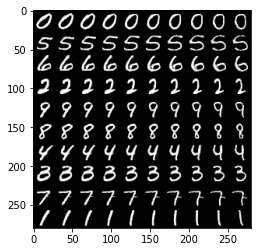

Epoch: 11/50, Step: 5500, D Loss: 0.7608077526092529, G Loss: 1.4980521202087402, GnQ Loss: 2.9223990440368652, Time: 2020-09-24 22:24:52


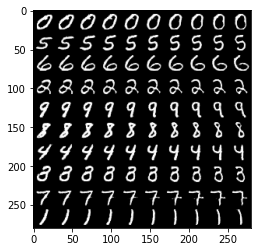

Epoch: 11/50, Step: 5600, D Loss: 0.8960157036781311, G Loss: 1.4624247550964355, GnQ Loss: 2.801133632659912, Time: 2020-09-24 22:25:13


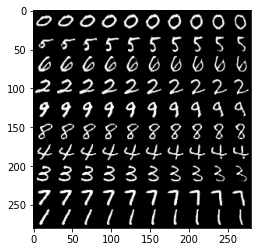

Epoch: 12/50, Step: 5700, D Loss: 0.8493509888648987, G Loss: 1.2673022747039795, GnQ Loss: 2.633802890777588, Time: 2020-09-24 22:25:34


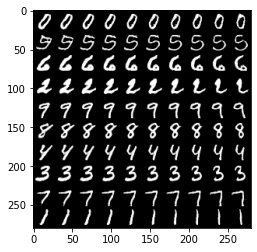

Epoch: 12/50, Step: 5800, D Loss: 0.7808826565742493, G Loss: 1.1898503303527832, GnQ Loss: 2.5336902141571045, Time: 2020-09-24 22:25:55


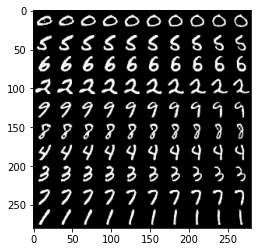

Epoch: 12/50, Step: 5900, D Loss: 0.9069851636886597, G Loss: 1.5083712339401245, GnQ Loss: 2.8852994441986084, Time: 2020-09-24 22:26:16


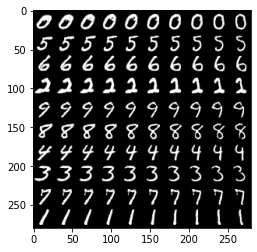

Epoch: 12/50, Step: 6000, D Loss: 0.8519505262374878, G Loss: 1.287325382232666, GnQ Loss: 2.6541361808776855, Time: 2020-09-24 22:26:36


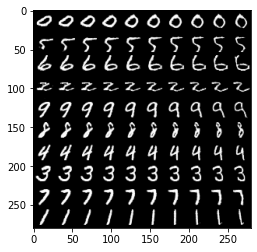

Epoch: 13/50, Step: 6100, D Loss: 0.7437291145324707, G Loss: 1.550534725189209, GnQ Loss: 2.9107823371887207, Time: 2020-09-24 22:26:57


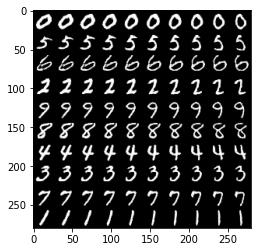

Epoch: 13/50, Step: 6200, D Loss: 0.7713019847869873, G Loss: 1.5394366979599, GnQ Loss: 2.899413824081421, Time: 2020-09-24 22:27:18


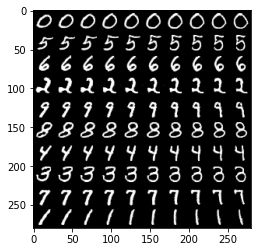

Epoch: 13/50, Step: 6300, D Loss: 0.7398530840873718, G Loss: 1.9602000713348389, GnQ Loss: 3.323333263397217, Time: 2020-09-24 22:27:38


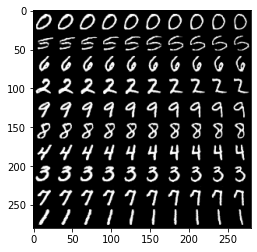

Epoch: 13/50, Step: 6400, D Loss: 0.6968088150024414, G Loss: 1.5670503377914429, GnQ Loss: 2.9125595092773438, Time: 2020-09-24 22:27:59


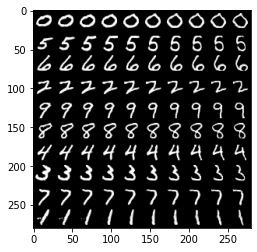

Epoch: 13/50, Step: 6500, D Loss: 0.6822782158851624, G Loss: 1.6667349338531494, GnQ Loss: 3.0554888248443604, Time: 2020-09-24 22:28:19


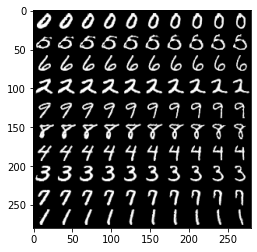

Epoch: 14/50, Step: 6600, D Loss: 0.6938414573669434, G Loss: 1.7938642501831055, GnQ Loss: 3.153606414794922, Time: 2020-09-24 22:28:40


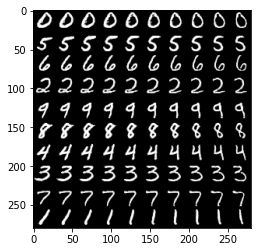

Epoch: 14/50, Step: 6700, D Loss: 0.8941641449928284, G Loss: 1.8039989471435547, GnQ Loss: 3.1434319019317627, Time: 2020-09-24 22:29:01


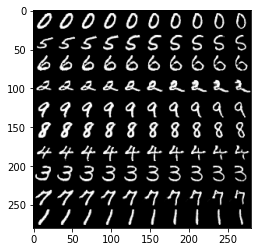

Epoch: 14/50, Step: 6800, D Loss: 0.6787230968475342, G Loss: 1.6418787240982056, GnQ Loss: 3.00443696975708, Time: 2020-09-24 22:29:21


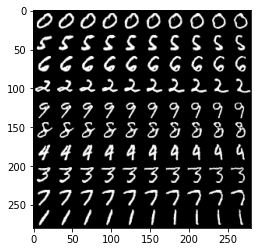

Epoch: 14/50, Step: 6900, D Loss: 0.8103070855140686, G Loss: 2.2525486946105957, GnQ Loss: 3.6189181804656982, Time: 2020-09-24 22:29:42


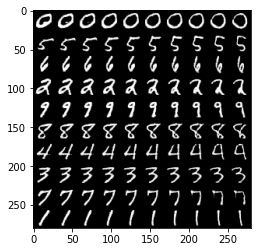

Epoch: 14/50, Step: 7000, D Loss: 0.7529926896095276, G Loss: 1.3696417808532715, GnQ Loss: 2.773240566253662, Time: 2020-09-24 22:30:03


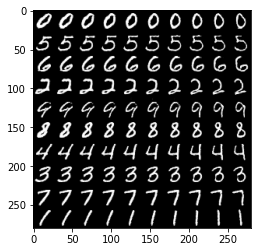

Epoch: 15/50, Step: 7100, D Loss: 0.6796251535415649, G Loss: 1.243453025817871, GnQ Loss: 2.690110206604004, Time: 2020-09-24 22:30:24


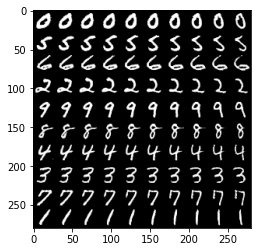

Epoch: 15/50, Step: 7200, D Loss: 0.7142468690872192, G Loss: 1.7700276374816895, GnQ Loss: 3.1412928104400635, Time: 2020-09-24 22:30:44


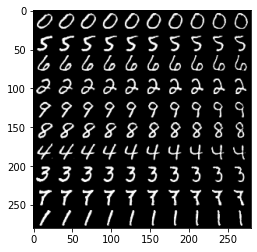

Epoch: 15/50, Step: 7300, D Loss: 0.7021485567092896, G Loss: 1.6527334451675415, GnQ Loss: 3.004500150680542, Time: 2020-09-24 22:31:05


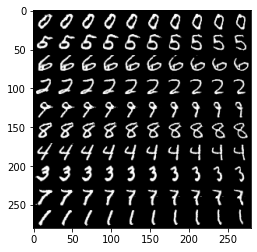

Epoch: 15/50, Step: 7400, D Loss: 0.6476593017578125, G Loss: 1.481776475906372, GnQ Loss: 2.859475612640381, Time: 2020-09-24 22:31:25


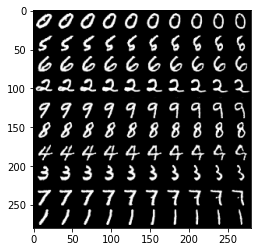

Epoch: 16/50, Step: 7500, D Loss: 0.6999132633209229, G Loss: 2.062894344329834, GnQ Loss: 3.4083425998687744, Time: 2020-09-24 22:31:46


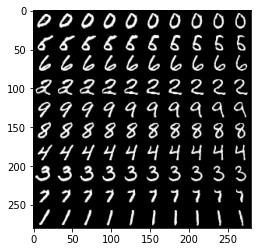

Epoch: 16/50, Step: 7600, D Loss: 0.7905277013778687, G Loss: 1.2255473136901855, GnQ Loss: 2.5921266078948975, Time: 2020-09-24 22:32:07


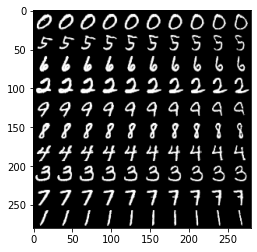

Epoch: 16/50, Step: 7700, D Loss: 0.8237037658691406, G Loss: 1.5896989107131958, GnQ Loss: 2.9351272583007812, Time: 2020-09-24 22:32:27


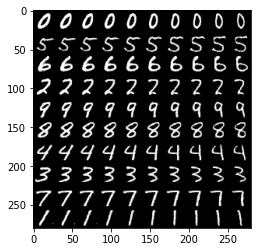

Epoch: 16/50, Step: 7800, D Loss: 0.7601054906845093, G Loss: 1.5283259153366089, GnQ Loss: 2.9207468032836914, Time: 2020-09-24 22:32:48


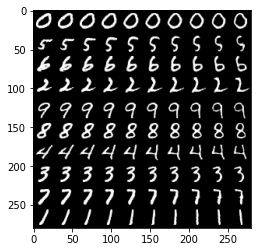

Epoch: 16/50, Step: 7900, D Loss: 0.5988757610321045, G Loss: 2.0607190132141113, GnQ Loss: 3.395191192626953, Time: 2020-09-24 22:33:08


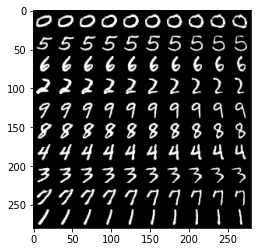

Epoch: 17/50, Step: 8000, D Loss: 0.6374239325523376, G Loss: 2.135695457458496, GnQ Loss: 3.4864087104797363, Time: 2020-09-24 22:33:29


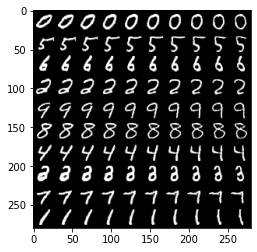

Epoch: 17/50, Step: 8100, D Loss: 0.5253665447235107, G Loss: 1.8737125396728516, GnQ Loss: 3.2239060401916504, Time: 2020-09-24 22:33:50


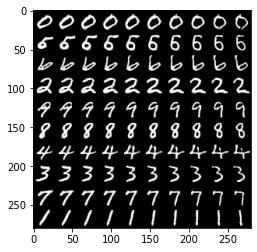

Epoch: 17/50, Step: 8200, D Loss: 0.7525374889373779, G Loss: 1.8633733987808228, GnQ Loss: 3.250781297683716, Time: 2020-09-24 22:34:11


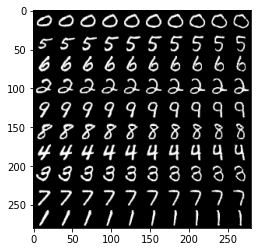

Epoch: 17/50, Step: 8300, D Loss: 0.6840614080429077, G Loss: 2.075416088104248, GnQ Loss: 3.4456660747528076, Time: 2020-09-24 22:34:32


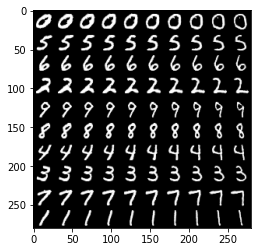

Epoch: 17/50, Step: 8400, D Loss: 0.6404540538787842, G Loss: 2.4297142028808594, GnQ Loss: 3.8219470977783203, Time: 2020-09-24 22:34:53


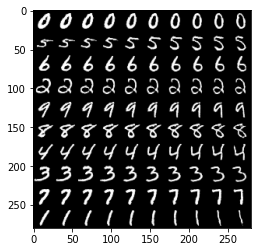

Epoch: 18/50, Step: 8500, D Loss: 0.5334248542785645, G Loss: 2.114535331726074, GnQ Loss: 3.4699618816375732, Time: 2020-09-24 22:35:14


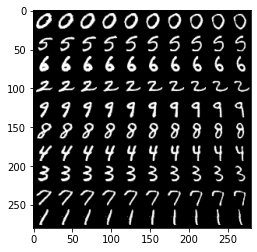

Epoch: 18/50, Step: 8600, D Loss: 0.5105394124984741, G Loss: 1.6992981433868408, GnQ Loss: 3.091097354888916, Time: 2020-09-24 22:35:35


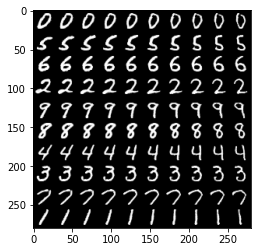

Epoch: 18/50, Step: 8700, D Loss: 0.6083834767341614, G Loss: 1.9155186414718628, GnQ Loss: 3.2821335792541504, Time: 2020-09-24 22:35:56


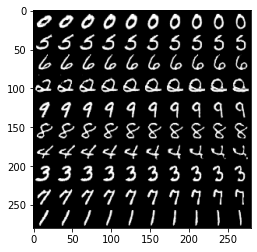

Epoch: 18/50, Step: 8800, D Loss: 0.6321321129798889, G Loss: 1.8676797151565552, GnQ Loss: 3.2426531314849854, Time: 2020-09-24 22:36:16


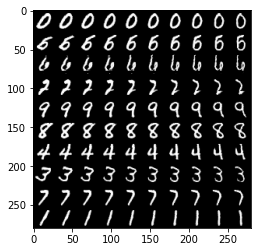

Epoch: 19/50, Step: 8900, D Loss: 0.566038966178894, G Loss: 2.1924099922180176, GnQ Loss: 3.5610058307647705, Time: 2020-09-24 22:36:37


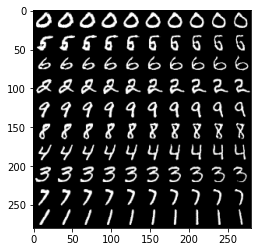

Epoch: 19/50, Step: 9000, D Loss: 0.637263298034668, G Loss: 2.238191604614258, GnQ Loss: 3.616926431655884, Time: 2020-09-24 22:36:58


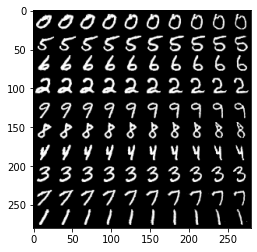

Epoch: 19/50, Step: 9100, D Loss: 0.6049771904945374, G Loss: 2.2438127994537354, GnQ Loss: 3.6006593704223633, Time: 2020-09-24 22:37:19


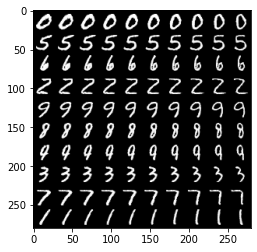

Epoch: 19/50, Step: 9200, D Loss: 0.6766813397407532, G Loss: 1.2755928039550781, GnQ Loss: 2.622251033782959, Time: 2020-09-24 22:37:40


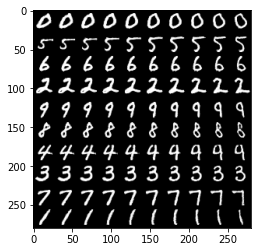

Epoch: 19/50, Step: 9300, D Loss: 0.7330160140991211, G Loss: 1.8946843147277832, GnQ Loss: 3.2537715435028076, Time: 2020-09-24 22:38:01


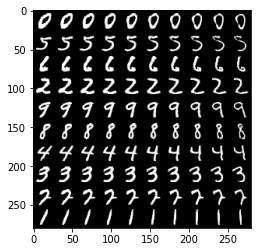

Epoch: 20/50, Step: 9400, D Loss: 0.8489695191383362, G Loss: 2.9552063941955566, GnQ Loss: 4.33673620223999, Time: 2020-09-24 22:38:21


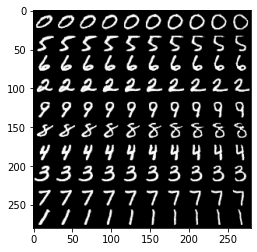

Epoch: 20/50, Step: 9500, D Loss: 0.625795304775238, G Loss: 1.2659637928009033, GnQ Loss: 2.6108055114746094, Time: 2020-09-24 22:38:42


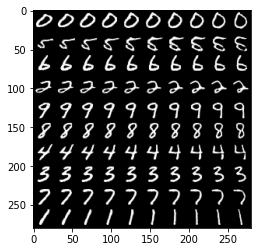

Epoch: 20/50, Step: 9600, D Loss: 0.529323160648346, G Loss: 1.443009614944458, GnQ Loss: 2.7941246032714844, Time: 2020-09-24 22:39:03


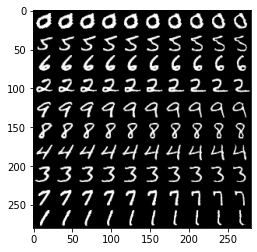

Epoch: 20/50, Step: 9700, D Loss: 0.758273720741272, G Loss: 2.218695878982544, GnQ Loss: 3.5682477951049805, Time: 2020-09-24 22:39:23


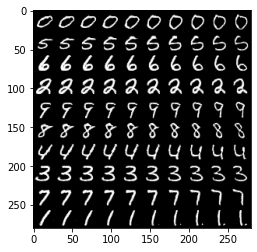

Epoch: 20/50, Step: 9800, D Loss: 0.5822180509567261, G Loss: 1.8468257188796997, GnQ Loss: 3.223043441772461, Time: 2020-09-24 22:39:44


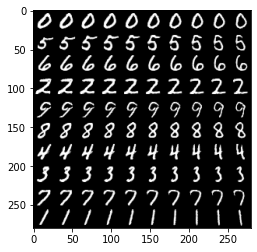

Epoch: 21/50, Step: 9900, D Loss: 0.5742295384407043, G Loss: 1.8630545139312744, GnQ Loss: 3.2188587188720703, Time: 2020-09-24 22:40:04


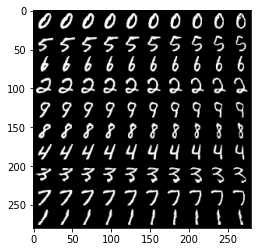

Epoch: 21/50, Step: 10000, D Loss: 0.5686929225921631, G Loss: 1.6732609272003174, GnQ Loss: 3.0269105434417725, Time: 2020-09-24 22:40:25


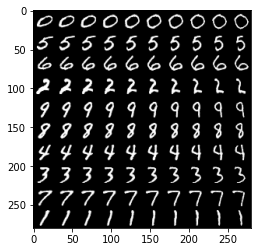

Epoch: 21/50, Step: 10100, D Loss: 0.609254002571106, G Loss: 1.8742585182189941, GnQ Loss: 3.226466417312622, Time: 2020-09-24 22:40:45


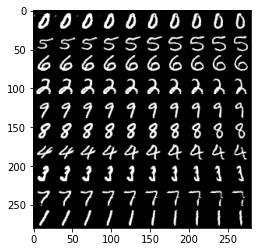

Epoch: 21/50, Step: 10200, D Loss: 0.6810128688812256, G Loss: 1.532002329826355, GnQ Loss: 2.8956046104431152, Time: 2020-09-24 22:41:06


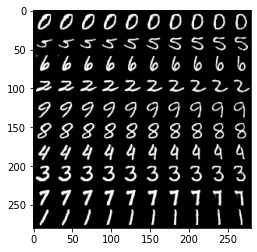

Epoch: 22/50, Step: 10300, D Loss: 0.4993954300880432, G Loss: 2.1337361335754395, GnQ Loss: 3.5109283924102783, Time: 2020-09-24 22:41:27


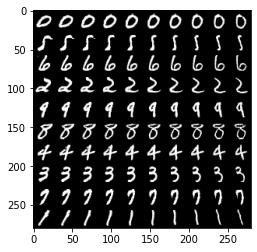

Epoch: 22/50, Step: 10400, D Loss: 0.5392406582832336, G Loss: 2.125171184539795, GnQ Loss: 3.5148978233337402, Time: 2020-09-24 22:41:47


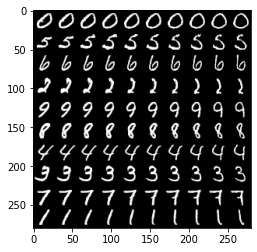

Epoch: 22/50, Step: 10500, D Loss: 0.635736882686615, G Loss: 2.7005014419555664, GnQ Loss: 4.0780839920043945, Time: 2020-09-24 22:42:08


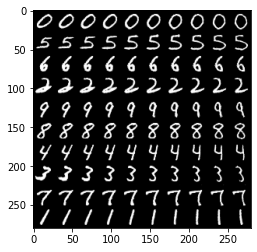

Epoch: 22/50, Step: 10600, D Loss: 0.5399335622787476, G Loss: 1.8973873853683472, GnQ Loss: 3.2581260204315186, Time: 2020-09-24 22:42:29


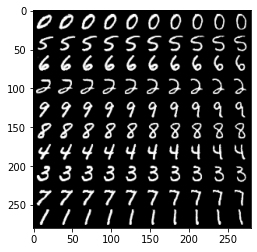

Epoch: 22/50, Step: 10700, D Loss: 0.6955747604370117, G Loss: 2.5167627334594727, GnQ Loss: 3.8614449501037598, Time: 2020-09-24 22:42:50


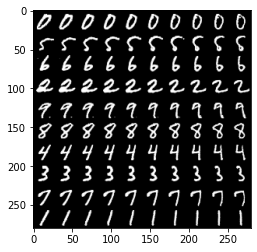

Epoch: 23/50, Step: 10800, D Loss: 0.6297768354415894, G Loss: 2.3001346588134766, GnQ Loss: 3.647806406021118, Time: 2020-09-24 22:43:10


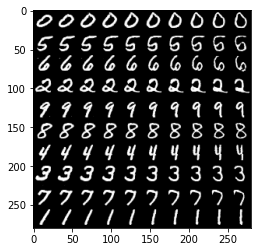

Epoch: 23/50, Step: 10900, D Loss: 0.5833497047424316, G Loss: 1.7460724115371704, GnQ Loss: 3.0994272232055664, Time: 2020-09-24 22:43:31


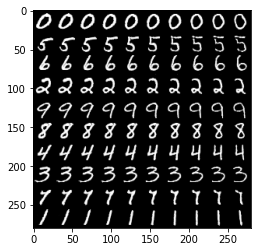

Epoch: 23/50, Step: 11000, D Loss: 0.38269513845443726, G Loss: 2.1899170875549316, GnQ Loss: 3.5348219871520996, Time: 2020-09-24 22:43:51


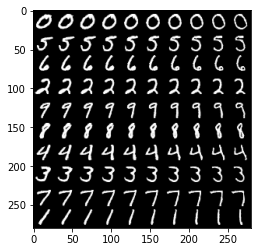

Epoch: 23/50, Step: 11100, D Loss: 0.5934001803398132, G Loss: 1.9939255714416504, GnQ Loss: 3.3628573417663574, Time: 2020-09-24 22:44:12


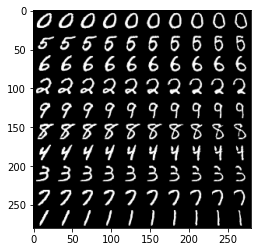

Epoch: 23/50, Step: 11200, D Loss: 0.6374062299728394, G Loss: 1.764374017715454, GnQ Loss: 3.1326560974121094, Time: 2020-09-24 22:44:32


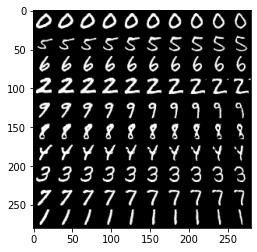

Epoch: 24/50, Step: 11300, D Loss: 0.5549602508544922, G Loss: 2.5025415420532227, GnQ Loss: 3.8652052879333496, Time: 2020-09-24 22:44:53


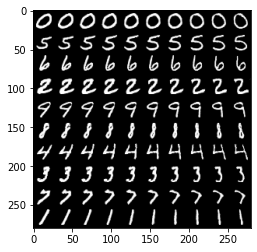

Epoch: 24/50, Step: 11400, D Loss: 0.7584948539733887, G Loss: 2.3782553672790527, GnQ Loss: 3.7551395893096924, Time: 2020-09-24 22:45:14


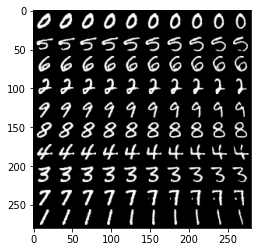

Epoch: 24/50, Step: 11500, D Loss: 0.6146317720413208, G Loss: 2.536515712738037, GnQ Loss: 3.910886764526367, Time: 2020-09-24 22:45:35


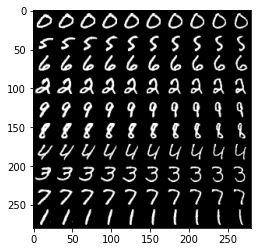

Epoch: 24/50, Step: 11600, D Loss: 0.4783467650413513, G Loss: 1.6560783386230469, GnQ Loss: 3.011279582977295, Time: 2020-09-24 22:45:56


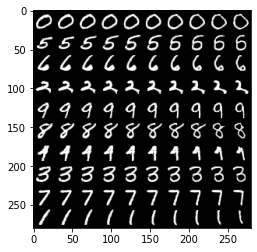

Epoch: 25/50, Step: 11700, D Loss: 0.5960049033164978, G Loss: 2.890679359436035, GnQ Loss: 4.291691780090332, Time: 2020-09-24 22:46:17


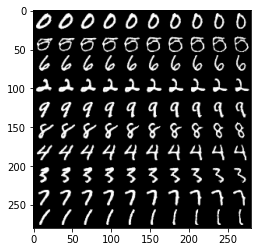

Epoch: 25/50, Step: 11800, D Loss: 0.5757296085357666, G Loss: 2.289530038833618, GnQ Loss: 3.6509158611297607, Time: 2020-09-24 22:46:38


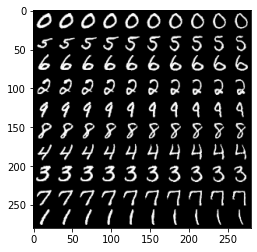

Epoch: 25/50, Step: 11900, D Loss: 0.44352737069129944, G Loss: 2.500896453857422, GnQ Loss: 3.867917060852051, Time: 2020-09-24 22:46:59


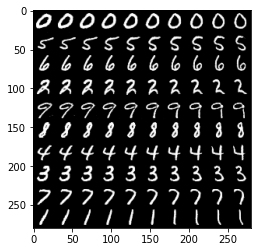

Epoch: 25/50, Step: 12000, D Loss: 0.533987283706665, G Loss: 2.388171672821045, GnQ Loss: 3.759472608566284, Time: 2020-09-24 22:47:20


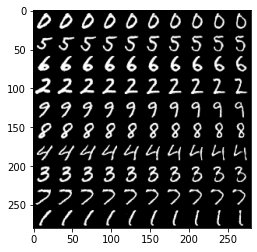

Epoch: 25/50, Step: 12100, D Loss: 0.6356678009033203, G Loss: 1.894390344619751, GnQ Loss: 3.276632308959961, Time: 2020-09-24 22:47:41


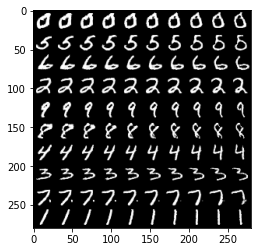

Epoch: 26/50, Step: 12200, D Loss: 0.6547775268554688, G Loss: 1.776102066040039, GnQ Loss: 3.1209146976470947, Time: 2020-09-24 22:48:03


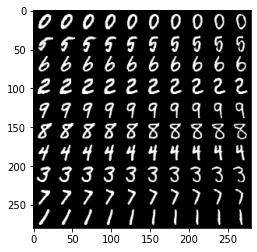

Epoch: 26/50, Step: 12300, D Loss: 0.46032455563545227, G Loss: 2.2192673683166504, GnQ Loss: 3.576315402984619, Time: 2020-09-24 22:48:24


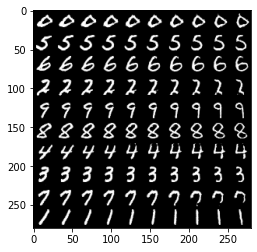

Epoch: 26/50, Step: 12400, D Loss: 0.5747323632240295, G Loss: 1.7359566688537598, GnQ Loss: 3.1276378631591797, Time: 2020-09-24 22:48:46


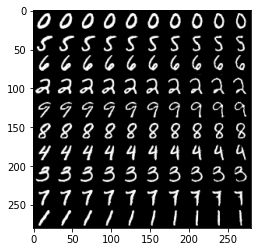

Epoch: 26/50, Step: 12500, D Loss: 0.5360059142112732, G Loss: 1.9821794033050537, GnQ Loss: 3.3507418632507324, Time: 2020-09-24 22:49:07


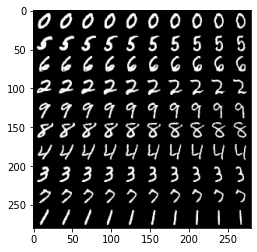

Epoch: 26/50, Step: 12600, D Loss: 0.5499932765960693, G Loss: 2.9308321475982666, GnQ Loss: 4.276610374450684, Time: 2020-09-24 22:49:29


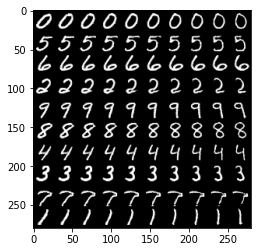

Epoch: 27/50, Step: 12700, D Loss: 0.6254141330718994, G Loss: 1.6726354360580444, GnQ Loss: 3.037815570831299, Time: 2020-09-24 22:49:50


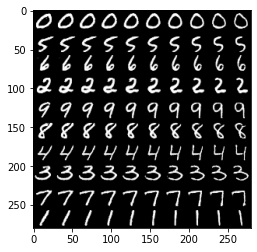

Epoch: 27/50, Step: 12800, D Loss: 0.4800189137458801, G Loss: 2.675626039505005, GnQ Loss: 4.0752105712890625, Time: 2020-09-24 22:50:12


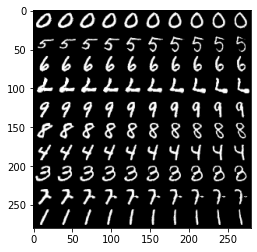

Epoch: 27/50, Step: 12900, D Loss: 0.7002633810043335, G Loss: 1.9304431676864624, GnQ Loss: 3.3051156997680664, Time: 2020-09-24 22:50:33


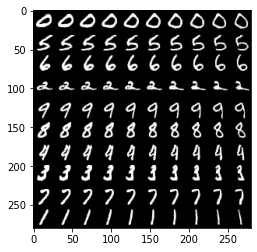

Epoch: 27/50, Step: 13000, D Loss: 0.5218834280967712, G Loss: 2.240934371948242, GnQ Loss: 3.5994951725006104, Time: 2020-09-24 22:50:54


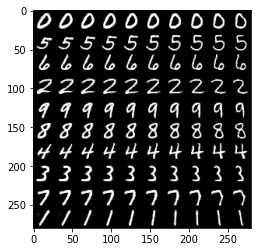

Epoch: 27/50, Step: 13100, D Loss: 0.5298063158988953, G Loss: 2.430514335632324, GnQ Loss: 3.7976980209350586, Time: 2020-09-24 22:51:15


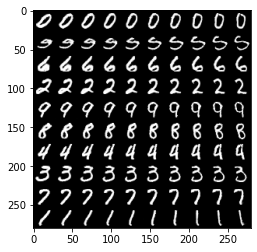

Epoch: 28/50, Step: 13200, D Loss: 0.6039633750915527, G Loss: 2.3980188369750977, GnQ Loss: 3.7572293281555176, Time: 2020-09-24 22:51:36


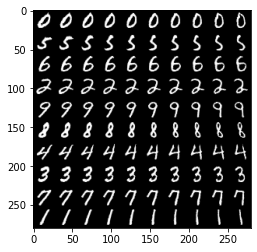

Epoch: 28/50, Step: 13300, D Loss: 0.42980730533599854, G Loss: 2.774346351623535, GnQ Loss: 4.1564412117004395, Time: 2020-09-24 22:51:57


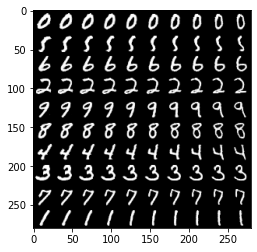

Epoch: 28/50, Step: 13400, D Loss: 0.5374854803085327, G Loss: 1.8546078205108643, GnQ Loss: 3.20314359664917, Time: 2020-09-24 22:52:17


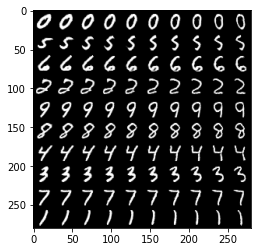

Epoch: 28/50, Step: 13500, D Loss: 0.49018973112106323, G Loss: 1.9865832328796387, GnQ Loss: 3.36002516746521, Time: 2020-09-24 22:52:38


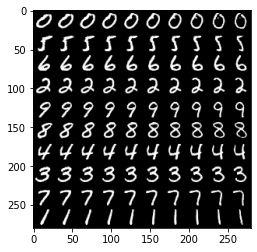

Epoch: 29/50, Step: 13600, D Loss: 0.5577362775802612, G Loss: 1.3960849046707153, GnQ Loss: 2.7571301460266113, Time: 2020-09-24 22:52:59


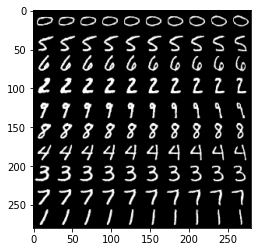

Epoch: 29/50, Step: 13700, D Loss: 0.4851544499397278, G Loss: 2.149446487426758, GnQ Loss: 3.5195538997650146, Time: 2020-09-24 22:53:20


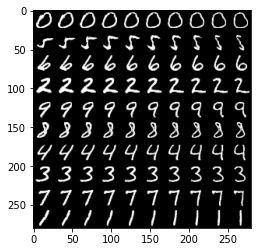

Epoch: 29/50, Step: 13800, D Loss: 0.4467545449733734, G Loss: 2.2430930137634277, GnQ Loss: 3.650599718093872, Time: 2020-09-24 22:53:41


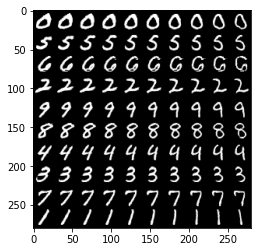

Epoch: 29/50, Step: 13900, D Loss: 0.6967171430587769, G Loss: 1.351428747177124, GnQ Loss: 2.7069578170776367, Time: 2020-09-24 22:54:02


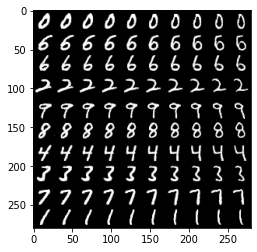

Epoch: 29/50, Step: 14000, D Loss: 0.7079579830169678, G Loss: 1.7189985513687134, GnQ Loss: 3.102160930633545, Time: 2020-09-24 22:54:23


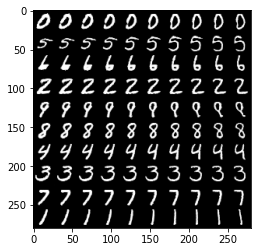

Epoch: 30/50, Step: 14100, D Loss: 0.383695125579834, G Loss: 2.1118736267089844, GnQ Loss: 3.4824657440185547, Time: 2020-09-24 22:54:44


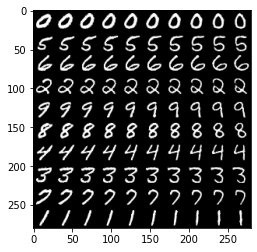

Epoch: 30/50, Step: 14200, D Loss: 0.506873607635498, G Loss: 1.676074743270874, GnQ Loss: 3.0449323654174805, Time: 2020-09-24 22:55:05


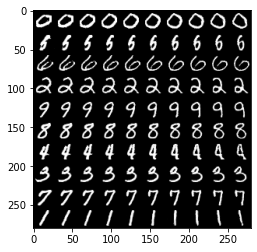

Epoch: 30/50, Step: 14300, D Loss: 0.45148444175720215, G Loss: 2.4662814140319824, GnQ Loss: 3.8384037017822266, Time: 2020-09-24 22:55:26


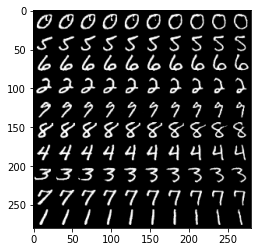

Epoch: 30/50, Step: 14400, D Loss: 0.5326055288314819, G Loss: 1.5804665088653564, GnQ Loss: 2.9524083137512207, Time: 2020-09-24 22:55:47


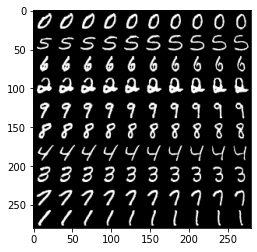

Epoch: 30/50, Step: 14500, D Loss: 0.5782122611999512, G Loss: 2.1930103302001953, GnQ Loss: 3.548065662384033, Time: 2020-09-24 22:56:08


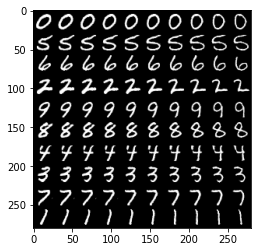

Epoch: 31/50, Step: 14600, D Loss: 0.5034250020980835, G Loss: 2.3982691764831543, GnQ Loss: 3.7661962509155273, Time: 2020-09-24 22:56:29


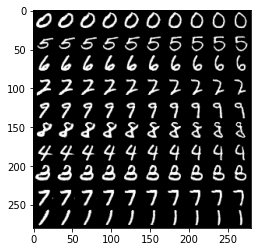

Epoch: 31/50, Step: 14700, D Loss: 0.4452485144138336, G Loss: 2.6918718814849854, GnQ Loss: 4.078953266143799, Time: 2020-09-24 22:56:50


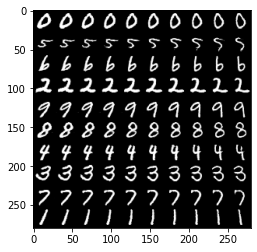

Epoch: 31/50, Step: 14800, D Loss: 0.433915376663208, G Loss: 2.2799248695373535, GnQ Loss: 3.6461293697357178, Time: 2020-09-24 22:57:11


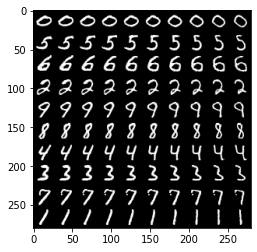

Epoch: 31/50, Step: 14900, D Loss: 0.4054015278816223, G Loss: 2.4001991748809814, GnQ Loss: 3.796079635620117, Time: 2020-09-24 22:57:31


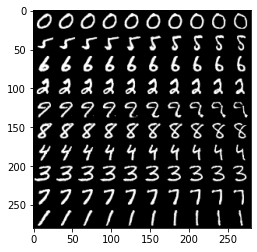

Epoch: 32/50, Step: 15000, D Loss: 0.3862738013267517, G Loss: 2.4843578338623047, GnQ Loss: 3.864504814147949, Time: 2020-09-24 22:57:52


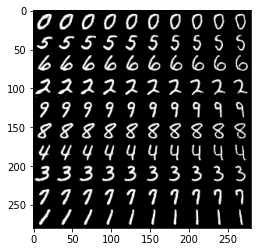

Epoch: 32/50, Step: 15100, D Loss: 0.5398541688919067, G Loss: 3.195803642272949, GnQ Loss: 4.575170516967773, Time: 2020-09-24 22:58:12


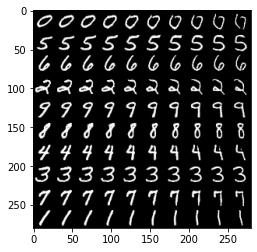

Epoch: 32/50, Step: 15200, D Loss: 0.4518369138240814, G Loss: 2.041703701019287, GnQ Loss: 3.4240732192993164, Time: 2020-09-24 22:58:33


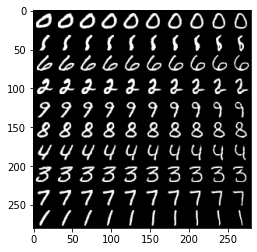

Epoch: 32/50, Step: 15300, D Loss: 0.5069643259048462, G Loss: 3.319763660430908, GnQ Loss: 4.69856071472168, Time: 2020-09-24 22:58:54


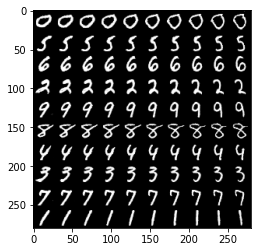

Epoch: 32/50, Step: 15400, D Loss: 0.5400990843772888, G Loss: 2.7305030822753906, GnQ Loss: 4.080783367156982, Time: 2020-09-24 22:59:15


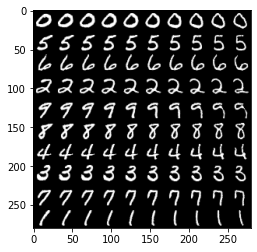

Epoch: 33/50, Step: 15500, D Loss: 0.5101038217544556, G Loss: 2.3310861587524414, GnQ Loss: 3.709813356399536, Time: 2020-09-24 22:59:36


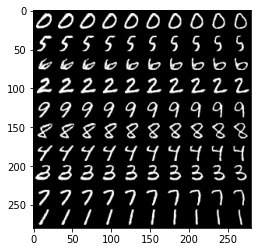

Epoch: 33/50, Step: 15600, D Loss: 0.44063061475753784, G Loss: 2.6356098651885986, GnQ Loss: 4.0212554931640625, Time: 2020-09-24 22:59:57


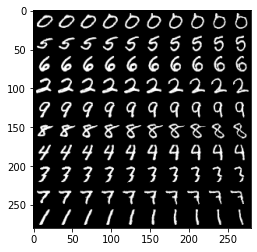

Epoch: 33/50, Step: 15700, D Loss: 0.49562305212020874, G Loss: 2.7602148056030273, GnQ Loss: 4.1086812019348145, Time: 2020-09-24 23:00:18


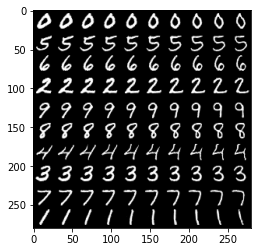

Epoch: 33/50, Step: 15800, D Loss: 0.4766049087047577, G Loss: 2.6173644065856934, GnQ Loss: 4.013370990753174, Time: 2020-09-24 23:00:39


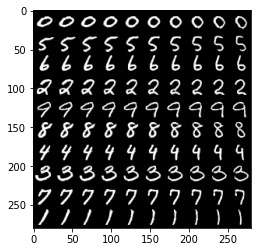

Epoch: 33/50, Step: 15900, D Loss: 0.49579426646232605, G Loss: 2.658271312713623, GnQ Loss: 4.055691719055176, Time: 2020-09-24 23:01:00


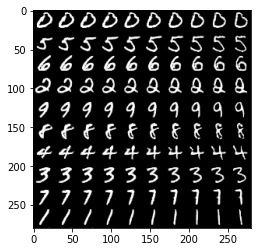

Epoch: 34/50, Step: 16000, D Loss: 0.4973537027835846, G Loss: 2.477046012878418, GnQ Loss: 3.836033344268799, Time: 2020-09-24 23:01:21


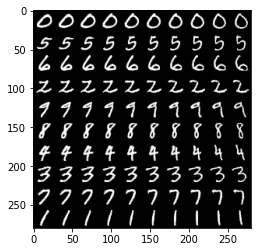

Epoch: 34/50, Step: 16100, D Loss: 0.4620411992073059, G Loss: 1.723734736442566, GnQ Loss: 3.067669630050659, Time: 2020-09-24 23:01:41


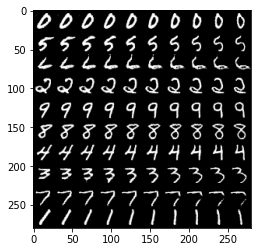

Epoch: 34/50, Step: 16200, D Loss: 0.5149976015090942, G Loss: 2.6671817302703857, GnQ Loss: 4.040157318115234, Time: 2020-09-24 23:02:02


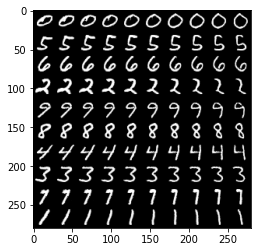

Epoch: 34/50, Step: 16300, D Loss: 0.4483456313610077, G Loss: 2.101388454437256, GnQ Loss: 3.467703342437744, Time: 2020-09-24 23:02:23


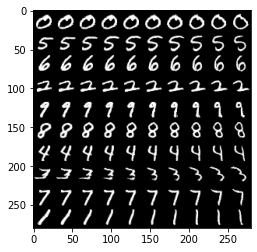

Epoch: 35/50, Step: 16400, D Loss: 0.34537991881370544, G Loss: 2.0967798233032227, GnQ Loss: 3.434011936187744, Time: 2020-09-24 23:02:44


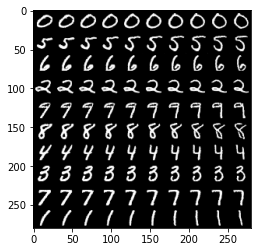

Epoch: 35/50, Step: 16500, D Loss: 0.5649135112762451, G Loss: 2.002686023712158, GnQ Loss: 3.3484561443328857, Time: 2020-09-24 23:03:05


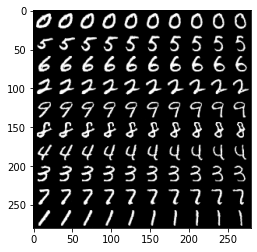

Epoch: 35/50, Step: 16600, D Loss: 0.4619675576686859, G Loss: 2.0250439643859863, GnQ Loss: 3.411756992340088, Time: 2020-09-24 23:03:26


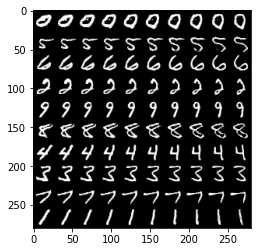

Epoch: 35/50, Step: 16700, D Loss: 0.47045642137527466, G Loss: 2.7405903339385986, GnQ Loss: 4.1036295890808105, Time: 2020-09-24 23:03:47


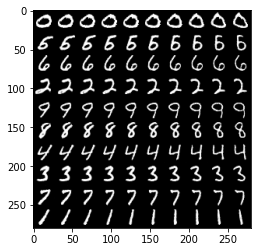

Epoch: 35/50, Step: 16800, D Loss: 0.41033321619033813, G Loss: 2.521266460418701, GnQ Loss: 3.868818759918213, Time: 2020-09-24 23:04:08


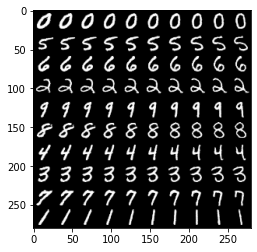

Epoch: 36/50, Step: 16900, D Loss: 0.4410335421562195, G Loss: 3.202784299850464, GnQ Loss: 4.5993523597717285, Time: 2020-09-24 23:04:29


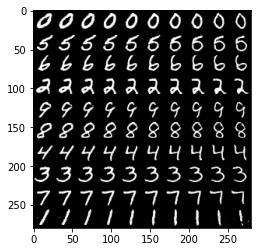

Epoch: 36/50, Step: 17000, D Loss: 0.7572593688964844, G Loss: 3.6681952476501465, GnQ Loss: 5.018641948699951, Time: 2020-09-24 23:04:50


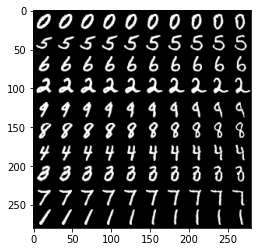

Epoch: 36/50, Step: 17100, D Loss: 0.573347806930542, G Loss: 2.3867411613464355, GnQ Loss: 3.77375864982605, Time: 2020-09-24 23:05:11


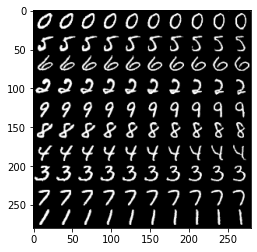

Epoch: 36/50, Step: 17200, D Loss: 0.557844340801239, G Loss: 2.335712432861328, GnQ Loss: 3.691254138946533, Time: 2020-09-24 23:05:32


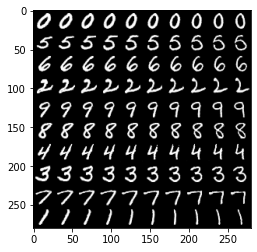

Epoch: 36/50, Step: 17300, D Loss: 0.6244744658470154, G Loss: 2.882986307144165, GnQ Loss: 4.245345592498779, Time: 2020-09-24 23:05:53


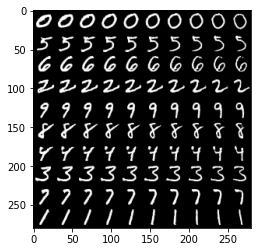

Epoch: 37/50, Step: 17400, D Loss: 0.4876137375831604, G Loss: 2.6263275146484375, GnQ Loss: 3.997427463531494, Time: 2020-09-24 23:06:14


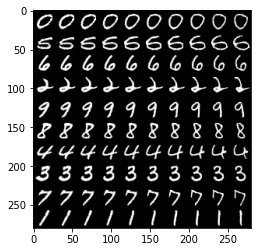

Epoch: 37/50, Step: 17500, D Loss: 0.42106783390045166, G Loss: 2.672213077545166, GnQ Loss: 4.039729118347168, Time: 2020-09-24 23:06:34


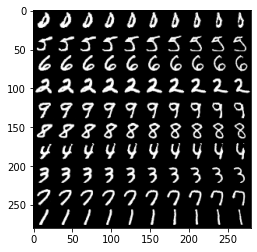

Epoch: 37/50, Step: 17600, D Loss: 0.4384766221046448, G Loss: 2.411519765853882, GnQ Loss: 3.765472412109375, Time: 2020-09-24 23:06:55


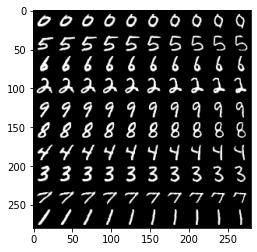

Epoch: 37/50, Step: 17700, D Loss: 0.4466753304004669, G Loss: 2.246236562728882, GnQ Loss: 3.587258815765381, Time: 2020-09-24 23:07:15


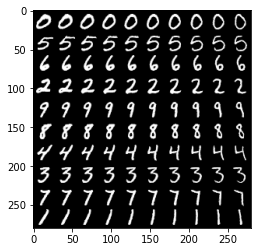

Epoch: 38/50, Step: 17800, D Loss: 0.41556107997894287, G Loss: 2.374885320663452, GnQ Loss: 3.752052068710327, Time: 2020-09-24 23:07:36


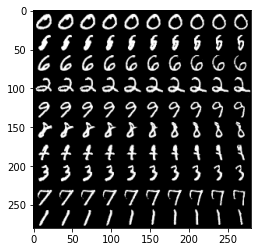

Epoch: 38/50, Step: 17900, D Loss: 0.522087574005127, G Loss: 2.2196755409240723, GnQ Loss: 3.57108736038208, Time: 2020-09-24 23:07:57


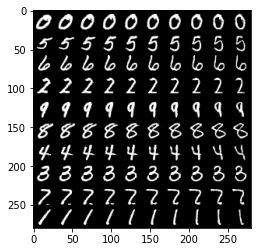

Epoch: 38/50, Step: 18000, D Loss: 0.6119664311408997, G Loss: 2.7909295558929443, GnQ Loss: 4.1487531661987305, Time: 2020-09-24 23:08:18


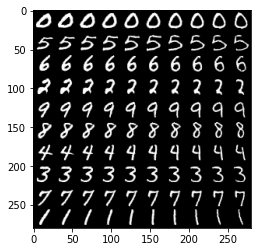

Epoch: 38/50, Step: 18100, D Loss: 0.6059680581092834, G Loss: 2.115217447280884, GnQ Loss: 3.471076726913452, Time: 2020-09-24 23:08:39


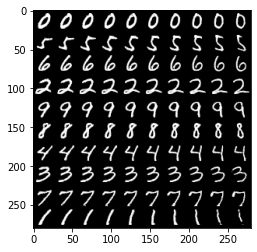

Epoch: 38/50, Step: 18200, D Loss: 0.3722001910209656, G Loss: 3.192654848098755, GnQ Loss: 4.5464887619018555, Time: 2020-09-24 23:09:00


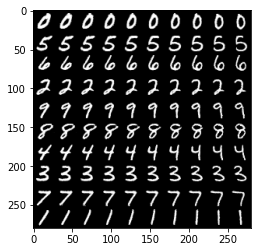

Epoch: 39/50, Step: 18300, D Loss: 0.4501146078109741, G Loss: 3.2179229259490967, GnQ Loss: 4.626543998718262, Time: 2020-09-24 23:09:20


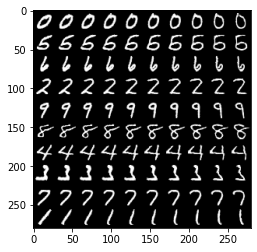

Epoch: 39/50, Step: 18400, D Loss: 0.4301806688308716, G Loss: 2.7207040786743164, GnQ Loss: 4.060912132263184, Time: 2020-09-24 23:09:41


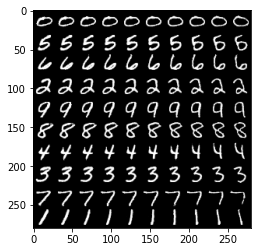

Epoch: 39/50, Step: 18500, D Loss: 0.4956197738647461, G Loss: 2.3719375133514404, GnQ Loss: 3.7334413528442383, Time: 2020-09-24 23:10:02


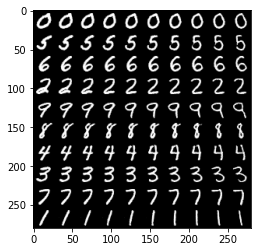

Epoch: 39/50, Step: 18600, D Loss: 0.5947652459144592, G Loss: 2.8516159057617188, GnQ Loss: 4.212600231170654, Time: 2020-09-24 23:10:22


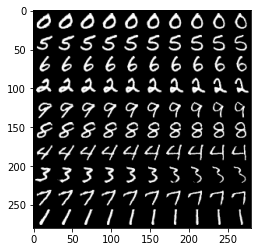

Epoch: 39/50, Step: 18700, D Loss: 0.4395783543586731, G Loss: 2.8993561267852783, GnQ Loss: 4.263422966003418, Time: 2020-09-24 23:10:43


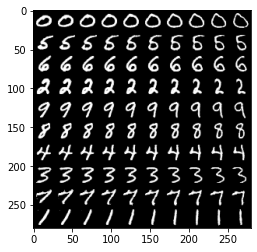

Epoch: 40/50, Step: 18800, D Loss: 0.4881192147731781, G Loss: 2.8939099311828613, GnQ Loss: 4.265104293823242, Time: 2020-09-24 23:11:04


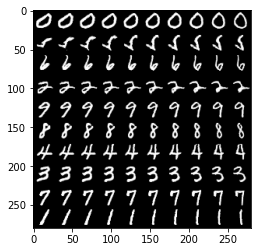

Epoch: 40/50, Step: 18900, D Loss: 0.41216427087783813, G Loss: 2.5166778564453125, GnQ Loss: 3.8682055473327637, Time: 2020-09-24 23:11:25


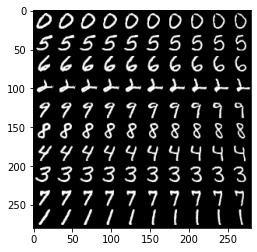

Epoch: 40/50, Step: 19000, D Loss: 0.5230838060379028, G Loss: 2.1214845180511475, GnQ Loss: 3.4732418060302734, Time: 2020-09-24 23:11:45


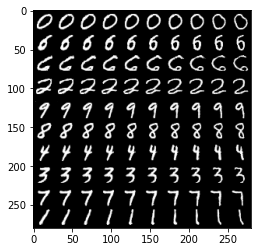

Epoch: 40/50, Step: 19100, D Loss: 0.3349348306655884, G Loss: 2.349893808364868, GnQ Loss: 3.740042209625244, Time: 2020-09-24 23:12:06


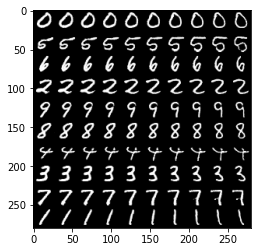

Epoch: 41/50, Step: 19200, D Loss: 0.38612890243530273, G Loss: 2.5147674083709717, GnQ Loss: 3.926487922668457, Time: 2020-09-24 23:12:27


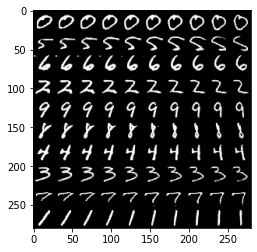

Epoch: 41/50, Step: 19300, D Loss: 0.43669623136520386, G Loss: 2.755671262741089, GnQ Loss: 4.113962173461914, Time: 2020-09-24 23:12:47


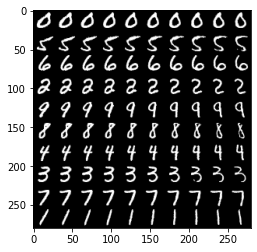

Epoch: 41/50, Step: 19400, D Loss: 0.6091090440750122, G Loss: 3.1873581409454346, GnQ Loss: 4.535491943359375, Time: 2020-09-24 23:13:08


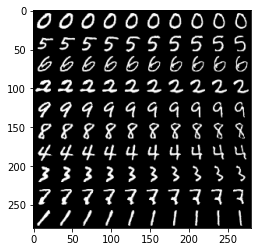

Epoch: 41/50, Step: 19500, D Loss: 0.740905225276947, G Loss: 1.5568184852600098, GnQ Loss: 2.9105429649353027, Time: 2020-09-24 23:13:29


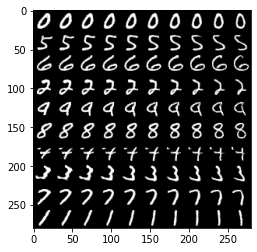

Epoch: 41/50, Step: 19600, D Loss: 0.38631001114845276, G Loss: 2.615530490875244, GnQ Loss: 3.978788375854492, Time: 2020-09-24 23:13:50


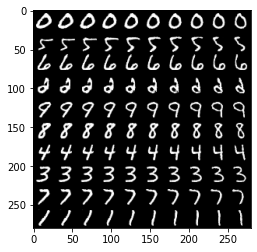

Epoch: 42/50, Step: 19700, D Loss: 0.40277260541915894, G Loss: 2.597926139831543, GnQ Loss: 3.997711658477783, Time: 2020-09-24 23:14:10


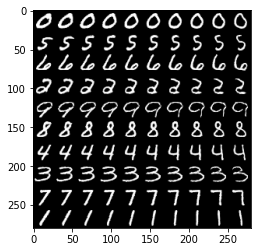

Epoch: 42/50, Step: 19800, D Loss: 0.394368052482605, G Loss: 2.8427248001098633, GnQ Loss: 4.185331344604492, Time: 2020-09-24 23:14:31


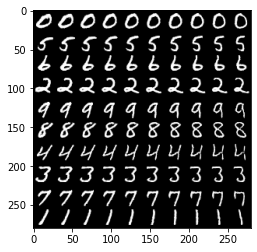

Epoch: 42/50, Step: 19900, D Loss: 0.5528250932693481, G Loss: 3.129364490509033, GnQ Loss: 4.486562728881836, Time: 2020-09-24 23:14:51


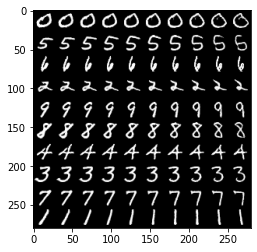

Epoch: 42/50, Step: 20000, D Loss: 0.37264156341552734, G Loss: 2.6356961727142334, GnQ Loss: 3.987673044204712, Time: 2020-09-24 23:15:12


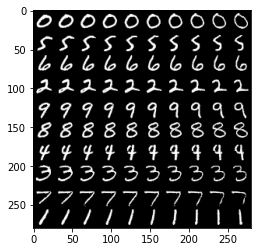

Epoch: 42/50, Step: 20100, D Loss: 0.32282060384750366, G Loss: 3.251734495162964, GnQ Loss: 4.607220649719238, Time: 2020-09-24 23:15:33


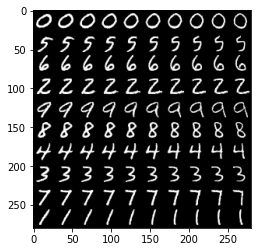

Epoch: 43/50, Step: 20200, D Loss: 0.3806641101837158, G Loss: 2.6633918285369873, GnQ Loss: 4.012070178985596, Time: 2020-09-24 23:15:54


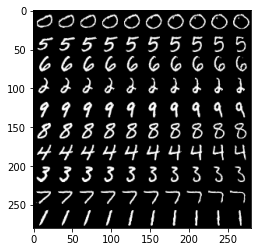

Epoch: 43/50, Step: 20300, D Loss: 0.3666836619377136, G Loss: 2.5448145866394043, GnQ Loss: 3.9266796112060547, Time: 2020-09-24 23:16:15


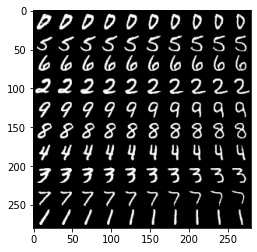

Epoch: 43/50, Step: 20400, D Loss: 0.3915838599205017, G Loss: 2.6236746311187744, GnQ Loss: 3.9876279830932617, Time: 2020-09-24 23:16:36


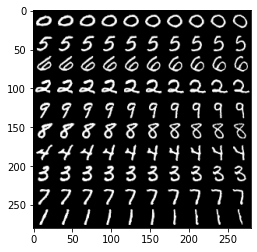

Epoch: 43/50, Step: 20500, D Loss: 0.49579113721847534, G Loss: 2.1054422855377197, GnQ Loss: 3.500730037689209, Time: 2020-09-24 23:16:56


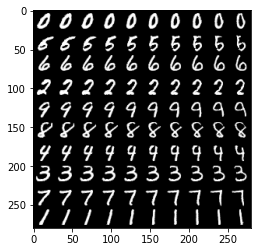

Epoch: 44/50, Step: 20600, D Loss: 0.35040605068206787, G Loss: 3.157158613204956, GnQ Loss: 4.545665264129639, Time: 2020-09-24 23:17:17


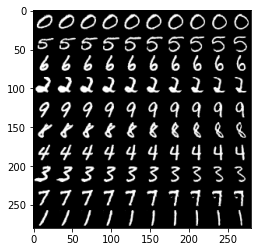

Epoch: 44/50, Step: 20700, D Loss: 0.37666410207748413, G Loss: 2.945279121398926, GnQ Loss: 4.298726558685303, Time: 2020-09-24 23:17:37


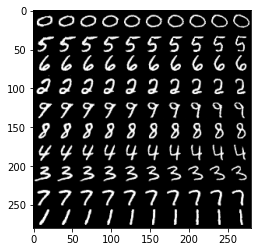

Epoch: 44/50, Step: 20800, D Loss: 0.4244638979434967, G Loss: 2.460806131362915, GnQ Loss: 3.821957588195801, Time: 2020-09-24 23:17:58


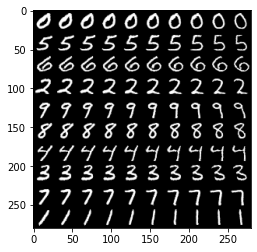

Epoch: 44/50, Step: 20900, D Loss: 0.40398257970809937, G Loss: 3.3424134254455566, GnQ Loss: 4.731886386871338, Time: 2020-09-24 23:18:19


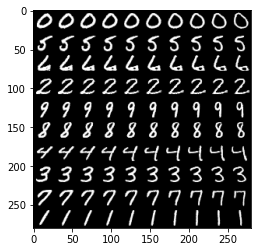

Epoch: 44/50, Step: 21000, D Loss: 0.3960956037044525, G Loss: 3.0517659187316895, GnQ Loss: 4.401716232299805, Time: 2020-09-24 23:18:39


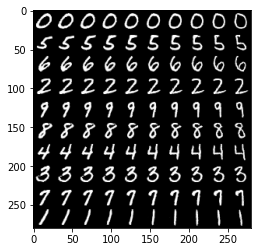

Epoch: 45/50, Step: 21100, D Loss: 0.40852147340774536, G Loss: 3.366833448410034, GnQ Loss: 4.750643730163574, Time: 2020-09-24 23:19:00


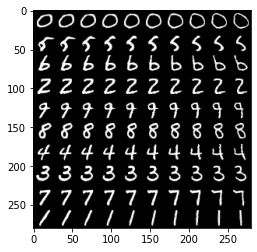

Epoch: 45/50, Step: 21200, D Loss: 0.404827743768692, G Loss: 2.9763612747192383, GnQ Loss: 4.344315528869629, Time: 2020-09-24 23:19:21


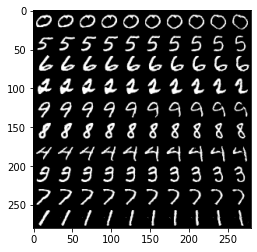

Epoch: 45/50, Step: 21300, D Loss: 0.4435192346572876, G Loss: 2.634371280670166, GnQ Loss: 4.0454792976379395, Time: 2020-09-24 23:19:41


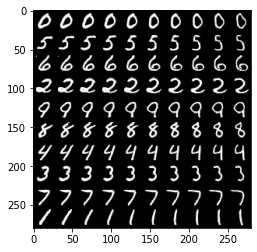

Epoch: 45/50, Step: 21400, D Loss: 0.4072265625, G Loss: 2.3168444633483887, GnQ Loss: 3.651608467102051, Time: 2020-09-24 23:20:02


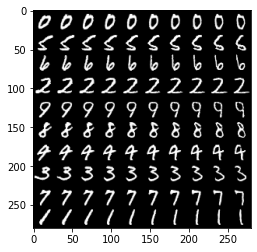

Epoch: 45/50, Step: 21500, D Loss: 0.36050909757614136, G Loss: 3.1651487350463867, GnQ Loss: 4.532142162322998, Time: 2020-09-24 23:20:23


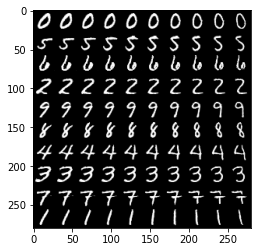

Epoch: 46/50, Step: 21600, D Loss: 0.37698957324028015, G Loss: 2.2198357582092285, GnQ Loss: 3.5837631225585938, Time: 2020-09-24 23:20:44


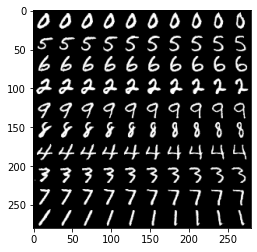

Epoch: 46/50, Step: 21700, D Loss: 0.434104859828949, G Loss: 2.686169385910034, GnQ Loss: 4.045825958251953, Time: 2020-09-24 23:21:04


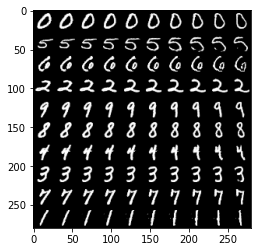

Epoch: 46/50, Step: 21800, D Loss: 0.4964727461338043, G Loss: 2.7032761573791504, GnQ Loss: 4.111213684082031, Time: 2020-09-24 23:21:25


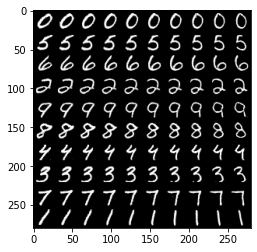

Epoch: 46/50, Step: 21900, D Loss: 0.4112195074558258, G Loss: 2.6905100345611572, GnQ Loss: 4.066728591918945, Time: 2020-09-24 23:21:46


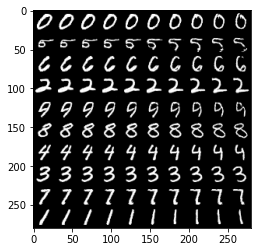

Epoch: 47/50, Step: 22000, D Loss: 0.3950992822647095, G Loss: 2.435532808303833, GnQ Loss: 3.7991788387298584, Time: 2020-09-24 23:22:07


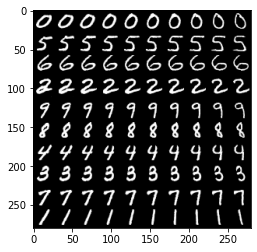

Epoch: 47/50, Step: 22100, D Loss: 0.3969413638114929, G Loss: 2.6853551864624023, GnQ Loss: 4.0464301109313965, Time: 2020-09-24 23:22:28


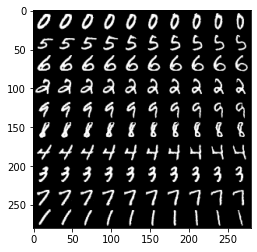

Epoch: 47/50, Step: 22200, D Loss: 0.560226559638977, G Loss: 1.8660387992858887, GnQ Loss: 3.2375335693359375, Time: 2020-09-24 23:22:48


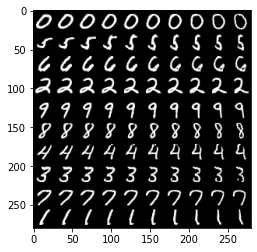

Epoch: 47/50, Step: 22300, D Loss: 0.3119083642959595, G Loss: 2.2774081230163574, GnQ Loss: 3.6278316974639893, Time: 2020-09-24 23:23:09


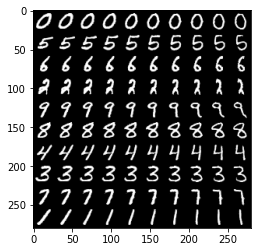

Epoch: 47/50, Step: 22400, D Loss: 0.3633101284503937, G Loss: 2.1311581134796143, GnQ Loss: 3.4798057079315186, Time: 2020-09-24 23:23:30


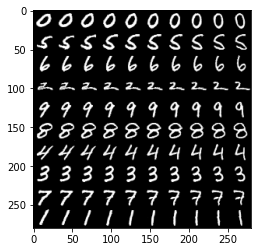

Epoch: 48/50, Step: 22500, D Loss: 0.5383150577545166, G Loss: 2.488515615463257, GnQ Loss: 3.849281072616577, Time: 2020-09-24 23:23:50


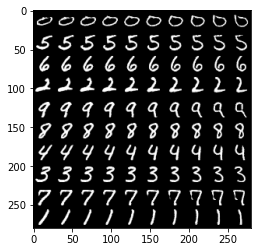

Epoch: 48/50, Step: 22600, D Loss: 0.42198318243026733, G Loss: 2.281672239303589, GnQ Loss: 3.6638834476470947, Time: 2020-09-24 23:24:11


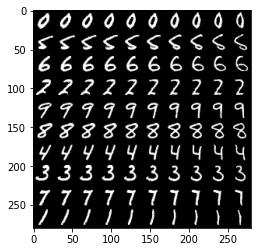

Epoch: 48/50, Step: 22700, D Loss: 0.4744897782802582, G Loss: 2.4050118923187256, GnQ Loss: 3.7661819458007812, Time: 2020-09-24 23:24:32


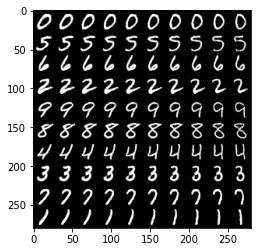

Epoch: 48/50, Step: 22800, D Loss: 0.4006507992744446, G Loss: 2.0315754413604736, GnQ Loss: 3.4029078483581543, Time: 2020-09-24 23:24:52


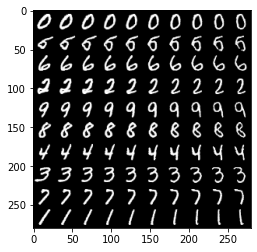

Epoch: 48/50, Step: 22900, D Loss: 0.3344458341598511, G Loss: 2.904306173324585, GnQ Loss: 4.248274803161621, Time: 2020-09-24 23:25:13


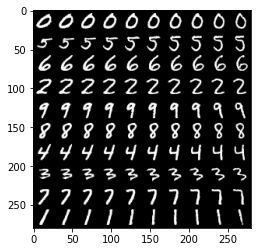

Epoch: 49/50, Step: 23000, D Loss: 0.4164053797721863, G Loss: 2.0898375511169434, GnQ Loss: 3.486837863922119, Time: 2020-09-24 23:25:34


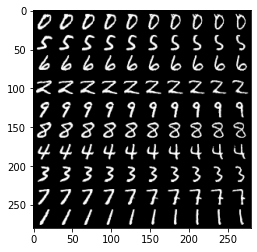

Epoch: 49/50, Step: 23100, D Loss: 0.5132584571838379, G Loss: 2.178741455078125, GnQ Loss: 3.525559186935425, Time: 2020-09-24 23:25:54


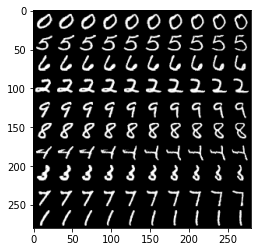

Epoch: 49/50, Step: 23200, D Loss: 0.37711262702941895, G Loss: 3.2075581550598145, GnQ Loss: 4.564957618713379, Time: 2020-09-24 23:26:15


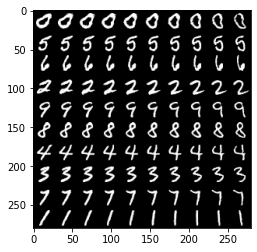

Epoch: 49/50, Step: 23300, D Loss: 0.41353029012680054, G Loss: 2.966186046600342, GnQ Loss: 4.343557357788086, Time: 2020-09-24 23:26:36


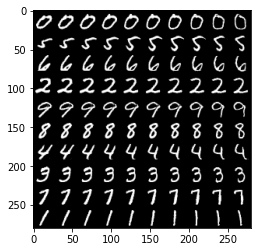

Epoch: 50/50, Step: 23400, D Loss: 0.3609660267829895, G Loss: 3.1000113487243652, GnQ Loss: 4.437357425689697, Time: 2020-09-24 23:26:57


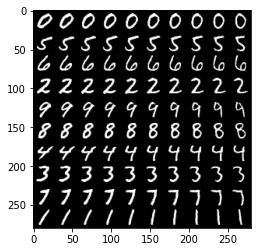

Epoch: 50/50, Step: 23500, D Loss: 0.31751012802124023, G Loss: 3.5588440895080566, GnQ Loss: 4.897575855255127, Time: 2020-09-24 23:27:18


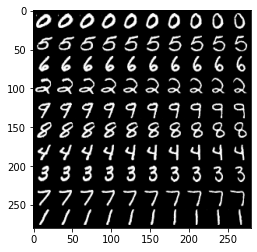

Epoch: 50/50, Step: 23600, D Loss: 0.29652881622314453, G Loss: 3.124478816986084, GnQ Loss: 4.467323303222656, Time: 2020-09-24 23:27:39


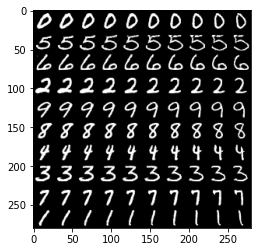

Epoch: 50/50, Step: 23700, D Loss: 0.48397406935691833, G Loss: 3.2943544387817383, GnQ Loss: 4.671719551086426, Time: 2020-09-24 23:28:00


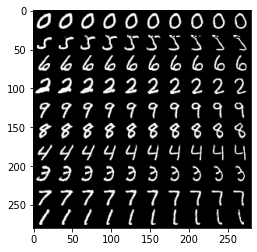

Epoch: 50/50, Step: 23800, D Loss: 0.38466253876686096, G Loss: 2.4003520011901855, GnQ Loss: 3.7589073181152344, Time: 2020-09-24 23:28:21


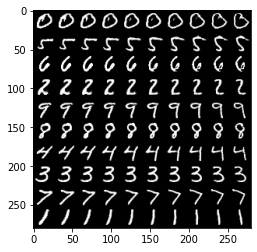

In [ ]:
for epoch in range(max_epoch+1):
    for idx, (images, labels) in enumerate(data_loader):
        labels = labels.view(batch_size, 1)
        # Training Discriminator
        x = images.to(DEVICE)
        x_outputs, _, = D(x)
        D_x_loss = bce_loss(x_outputs, D_labels)

        z, c = sample_noise(batch_size, n_noise, n_c_discrete, n_c_continuous, label=labels, supervised=True)
        z_outputs, _, = D(G(z, c))
        D_z_loss = bce_loss(z_outputs, D_fakes)
        D_loss = D_x_loss + D_z_loss

        D_opt.zero_grad()
        D_loss.backward()

## ------------------------------------------------------------------------------------------------------------------------------------------------------
        ## VAIK EDIT

        ## sigma = compute_sigma(epsilon, delta, mM)
        ##for parameter in D.parameters():
        ##  parameter.register_hook( partial(process_grad, sigma = sigma, C = C) )

## ------------------------------------------------------------------------------------------------------------------------------------------------------
        D_opt.step()

        # Training Generator
        z, c = sample_noise(batch_size, n_noise, n_c_discrete, n_c_continuous, label=labels, supervised=True)
        c_discrete_label = torch.max(c[:, :-2], 1)[1].view(-1, 1)

        z_outputs, features = D(G(z, c)) # (B,1), (B,10), (B,4)
        c_discrete_out, cc_mu, cc_var = Q(features)

        G_loss = bce_loss(z_outputs, D_labels)
        Q_loss_discrete = ce_loss(c_discrete_out, c_discrete_label.view(-1))
        Q_loss_continuous = -torch.mean(torch.sum(log_gaussian(c[:, -2:], cc_mu, cc_var), 1)) # N(x | mu,var) -> (B, 2) -> (,1)
        mutual_info_loss = Q_loss_discrete + Q_loss_continuous*0.1

        GnQ_loss = G_loss + mutual_info_loss

        G_opt.zero_grad()
        GnQ_loss.backward()
        G_opt.step()
      
        if step % 100 == 0:
            print('Epoch: {}/{}, Step: {}, D Loss: {}, G Loss: {}, GnQ Loss: {}, Time: {}'\
                  .format(epoch, max_epoch, step, D_loss.item(), G_loss.item(), GnQ_loss.item(), str(datetime.datetime.today())[:-7]))
            
        if step % 100 == 0:
            G.eval()
            img1, img2, img3 = get_sample_image()
            imshow(img1, cmap = 'gray')
            plt.show()
            G.train()
        step += 1


In [ ]:
sigma

14.500300052169043

# Sample

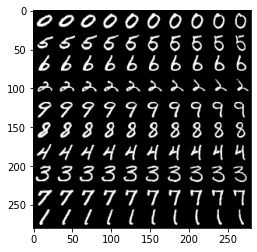

In [ ]:
# generation to image
G.eval()
imshow(get_sample_image()[0], cmap='gray')

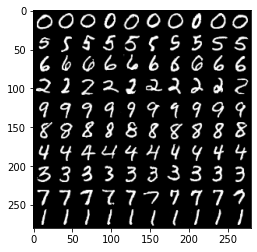

In [ ]:
imshow(get_sample_image()[2], cmap='gray')

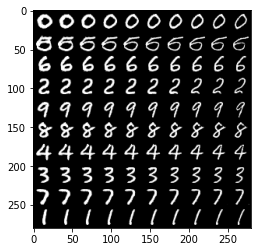

In [ ]:
imshow(get_sample_image()[1], cmap='gray')